## **Resizing**

In [ ]:
# Import necessary libraries
from PIL import Image
import os

# Define paths for images and masks
images_path = "/content/drive/MyDrive/Colab Notebooks/Project Implementation/New_Experiments/ORIGA&RIMONEDL_IMG_Masks/Images/"
masks_path = "/content/drive/MyDrive/Colab Notebooks/Project Implementation/New_Experiments/ORIGA&RIMONEDL_IMG_Masks/Masks/"
resized_images_path = "/content/drive/MyDrive/Colab Notebooks/Project Implementation/New_Experiments/ORIGA&RIMONEDL_Resized_IMG_Masks/Resized_Images/"
resized_masks_path = "/content/drive/MyDrive/Colab Notebooks/Project Implementation/New_Experiments/ORIGA&RIMONEDL_Resized_IMG_Masks/Resized_Masks/"


# Define target size for resizing images and masks
target_size = (128, 128)

# Get list of image and mask files
images = sorted(os.listdir(images_path))
masks = sorted(os.listdir(masks_path))

# Iterate over image and mask pairs
for image_name, mask_name in zip(images, masks):
    image_path = os.path.join(images_path, image_name)
    mask_path = os.path.join(masks_path, mask_name)

    # Open image and mask files
    image = Image.open(image_path)
    mask = Image.open(mask_path)

    # Resize image and mask
    resized_image = image.resize(target_size, Image.ANTIALIAS) #The Image.ANTIALIAS argument is used for resizing the image, while Image.
    resized_mask = mask.resize(target_size, Image.NEAREST) #NEAREST is used for resizing the mask to preserve the pixel values.

    # Save the resized images and masks
    resized_image.save(os.path.join(resized_images_path, os.path.splitext(image_name)[0] + ".png"), "PNG")
    resized_mask.save(os.path.join(resized_masks_path, os.path.splitext(mask_name)[0] + ".png"), "PNG")


# **Augmentation**

In [ ]:
# Install albumentations library
!pip install albumentations

In [ ]:
# Import necessary libraries
import numpy as np
from matplotlib import pyplot as plt
from skimage.transform import AffineTransform, warp, resize
from skimage import io, img_as_ubyte
import random
import os
from scipy.ndimage import rotate
import cv2

import albumentations as A

images_to_generate = 1360 #2040

images_path = "/content/drive/MyDrive/Colab Notebooks/Project Implementation/New_Experiments/ORIGA&RIMONEDL_Resized_IMG_Masks/Resized_Images/"
masks_path = "/content/drive/MyDrive/Colab Notebooks/Project Implementation/New_Experiments/ORIGA&RIMONEDL_Resized_IMG_Masks/Resized_Masks/"

# Define paths for augmented images and masks
img_augmented_path = "/content/drive/MyDrive/Colab Notebooks/Project Implementation/New_Experiments/ORIGA&RIMONEDL_after_augmentation_version_1/Images/"
msk_augmented_path = "/content/drive/MyDrive/Colab Notebooks/Project Implementation/New_Experiments/ORIGA&RIMONEDL_after_augmentation_version_1/Masks/"


# Get list of image and mask IDs
image_ids = [os.path.splitext(im)[0] for im in os.listdir(images_path)]
mask_ids = [os.path.splitext(msk)[0] for msk in os.listdir(masks_path)]

# Find common IDs between images and masks
common_ids = list(set(image_ids) & set(mask_ids))

# Define augmentation pipeline
aug = A.Compose([
    A.Rotate(limit=10, p=0.5),
    #A.RandomBrightnessContrast(brightness_limit=(-0.2, 0.2), p=0.2),
    A.HorizontalFlip(p=1)
])

# Initialize counters and lists for augmented images and masks
i = 1
augmented_images = []
augmented_masks = []

# Generate augmented images and masks
while i <= images_to_generate:
    # Select a common ID
    common_id = random.choice(common_ids)
    # Construct full file paths
    image = os.path.join(images_path, common_id + ".png")
    mask = os.path.join(masks_path, common_id + ".png")
    print(image, mask)
    # Open image and mask files
    original_image = io.imread(image)
    original_mask = io.imread(mask)

    image_shape = original_image.shape[:2]
    mask_shape = original_mask.shape[:2]
    # Check if image and mask have the same shape
    if image_shape != mask_shape:
        raise ValueError("Height and Width of image and mask should be equal.")
    # Apply augmentations
    augmented = aug(image=original_image, mask=original_mask)
    transformed_image = augmented['image']
    transformed_mask = augmented['mask']

    # Construct file paths for augmented images and masks
    new_image_path = "%s/augmented_image_%s.png" % (img_augmented_path, i)
    new_mask_path = "%s/augmented_mask_%s.png" % (msk_augmented_path, i)
    # Save augmented images and masks
    io.imsave(new_image_path, transformed_image)
    io.imsave(new_mask_path, transformed_mask)

    # Append augmented images and masks to lists
    augmented_images.append(transformed_image)
    augmented_masks.append(transformed_mask)
    # Increment counter
    i += 1


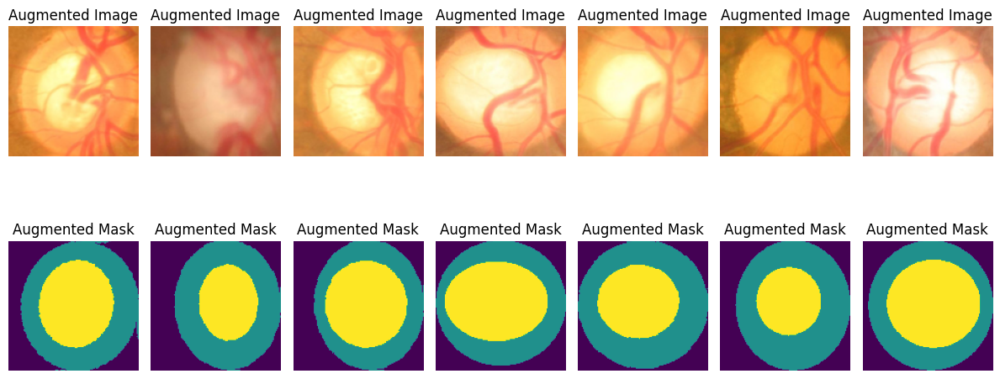

In [ ]:
# Visualize some of the augmented images with their corresponding masks
fig, axes = plt.subplots(nrows=2, ncols=7, figsize=(12, 6)) #r=2, c=5
for i in range(7):
    random_index = random.randint(0, len(augmented_images) - 1)
    axes[0, i].imshow(augmented_images[random_index].astype(np.uint8))
    axes[0, i].set_title("Augmented Image")
    axes[0, i].axis("off")

    axes[1, i].imshow(augmented_masks[random_index].astype(np.uint8))
    axes[1, i].set_title("Augmented Mask")
    axes[1, i].axis("off")

plt.tight_layout()
plt.show()


# **Denoising**

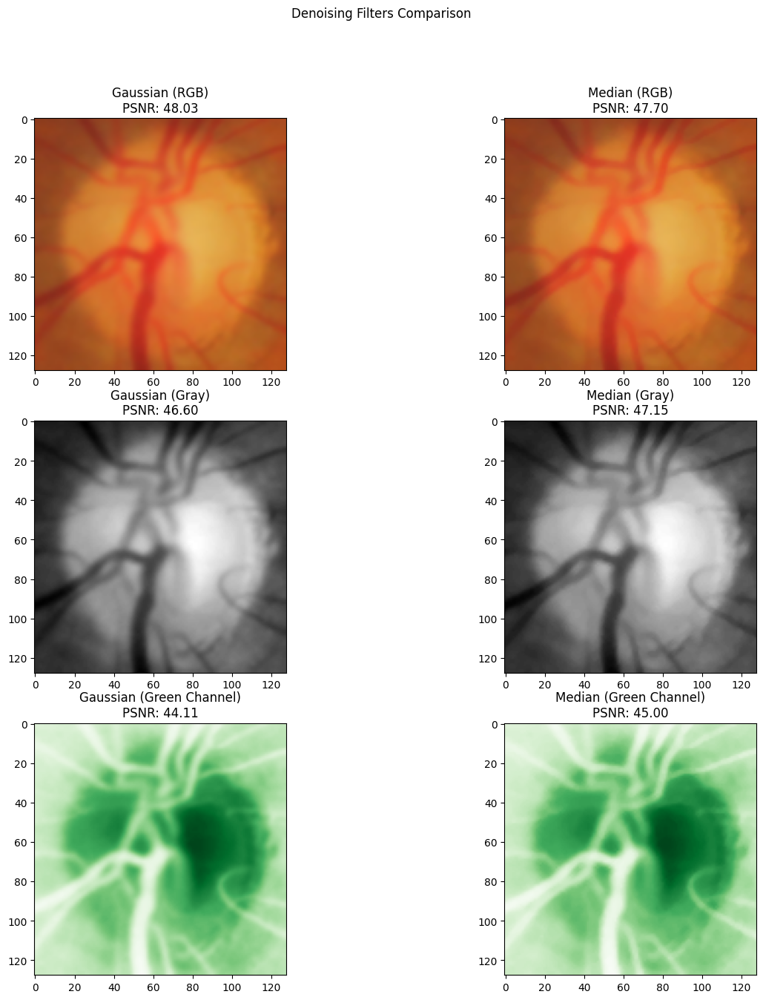

In [ ]:
# Import necessary libraries
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Define a function to calculate the Peak Signal-to-Noise Ratio (PSNR)
def psnr(original, processed):
    mse = np.mean((original - processed) ** 2)
    max_pixel = np.max(original)
    return 20 * np.log10(max_pixel / np.sqrt(mse))

# Load RGB fundus image
image = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Project Implementation/New_Experiments/ORIGA&RIMONEDL_Resized_IMG_Masks/Resized_Images/r2_Im429.png')

# Convert image to grayscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Split image into channels
b, g, r = cv2.split(image)

# Apply Gaussian filter to RGB image
gaussian_filtered_image = cv2.GaussianBlur(image, (3, 3), 0)
# Apply Median filter to RGB image
median_filtered_image = cv2.medianBlur(image, 3)

# Apply Gaussian filter to grayscale image
gaussian_filtered_gray_image = cv2.GaussianBlur(gray_image, (3, 3), 0)
# Apply Median filter to grayscale image
median_filtered_gray_image = cv2.medianBlur(gray_image, 3)


# Apply Gaussian filter to green channel
gaussian_filtered_green_channel = cv2.GaussianBlur(g, (3, 3), 0)
# Apply Median filter to green channel
median_filtered_green_channel = cv2.medianBlur(g, 3)

# Calculate PSNR for each case
psnr_gaussian_rgb = psnr(image.astype(float), gaussian_filtered_image.astype(float))
psnr_median_rgb = psnr(image.astype(float), median_filtered_image.astype(float))

psnr_gaussian_gray = psnr(gray_image.astype(float), gaussian_filtered_gray_image.astype(float))
psnr_median_gray = psnr(gray_image.astype(float), median_filtered_gray_image.astype(float))

psnr_gaussian_green_channel = psnr(g.astype(float), gaussian_filtered_green_channel.astype(float))
psnr_median_green_channel = psnr(g.astype(float), median_filtered_green_channel.astype(float))

# Display images and PSNR values in a comparison chart
fig, axs = plt.subplots(3, 2, figsize=(15, 15))

fig.suptitle('Denoising Filters Comparison')

axs[0, 0].imshow(cv2.cvtColor(gaussian_filtered_image, cv2.COLOR_BGR2RGB))
axs[0, 0].set_title(f'Gaussian (RGB)\nPSNR: {psnr_gaussian_rgb:.2f}')

axs[0, 1].imshow(cv2.cvtColor(median_filtered_image, cv2.COLOR_BGR2RGB))
axs[0, 1].set_title(f'Median (RGB)\nPSNR: {psnr_median_rgb:.2f}')

axs[1, 0].imshow(gaussian_filtered_gray_image, cmap='gray')
axs[1, 0].set_title(f'Gaussian (Gray)\nPSNR: {psnr_gaussian_gray:.2f}')

axs[1,1].imshow(median_filtered_gray_image, cmap='gray')
axs[1,1].set_title(f'Median (Gray)\nPSNR: {psnr_median_gray:.2f}')



axs[2, 0].imshow(gaussian_filtered_green_channel, cmap='Greens')
axs[2, 0].set_title(f'Gaussian (Green Channel)\nPSNR: {psnr_gaussian_green_channel:.2f}')

axs[2,1].imshow(median_filtered_green_channel, cmap='Greens')
axs[2,1].set_title(f'Median (Green Channel)\nPSNR: {psnr_median_green_channel:.2f}')

plt.savefig('/content/drive/MyDrive/Colab Notebooks/Project Implementation/Denoising/graphes/RIMONEDL_images and PSNR_kernel_3_graph.png')
plt.show()

# **Segmentation**
Experiment 1
Dataset:ORIGA&REFUGE

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
# Install necessary packages
!pip install tensorflow==2.12
!pip install keras==2.12
!pip install -U segmentation-models

In [ ]:
import keras
import tensorflow as tf
print(keras.__version__)
print(tf.__version__)

2.12.0
2.12.0


In [ ]:
import os
os.environ["SM_FRAMEWORK"] = "tf.keras"

from tensorflow import keras


In [ ]:
import segmentation_models as sm

Segmentation Models: using `tf.keras` framework.


In [ ]:

import glob
import cv2
import numpy as np
from matplotlib import pyplot as plt

In [ ]:
'''
# Function to apply denoising to an image using either a Gaussian filter or a median filter
def denoise_image(image, filter_type='gaussian', filter_size=3):
    if filter_type == 'gaussian':
        denoised_image = cv2.GaussianBlur(image, (filter_size, filter_size), 0)
    elif filter_type == 'median':
        denoised_image = cv2.medianBlur(image, filter_size)
    else:
        raise ValueError("Invalid filter_type. Choose 'gaussian' or 'median'.")

    return denoised_image
'''

In [ ]:
'''
#new version


def denoise_image(image, filter_type='bilateral', filter_size=3):
    if filter_type == 'gaussian':
        denoised_image = cv2.GaussianBlur(image, (filter_size, filter_size), 0)
    elif filter_type == 'median':
        denoised_image = cv2.medianBlur(image, filter_size)
    elif filter_type == 'bilateral':
        denoised_image = cv2.bilateralFilter(image, 3, 3, 3)  # Add bilateral filter code here
    else:
        raise ValueError("Invalid filter_type. Choose 'gaussian', 'median', or 'bilateral'.")

    return denoised_image
'''

In [ ]:
#Resizing images, if needed

SIZE_X = 128
SIZE_Y = 128

n_classes=3 #Number of classes for segmentation
num_images = 1248  #Total 416 available // augmentation = 832, augmentation_V2= 1248

In [ ]:
# Load image and mask names
image_names = glob.glob("/content/drive/MyDrive/Colab Notebooks/Project Implementation/Experiment 1/ORIGA&REFUGE_Balanced_Resized_after_augmentation_V2/Images/*.png")
image_names.sort()
image_names_subset = image_names[0:num_images]
images = [cv2.imread(image, 1) for image in image_names_subset] #SM backbones use 3 channel images, so let us read images in color.

In [ ]:
#Convert the list of resized images to a numpy array
image_dataset = np.array(images)

In [ ]:
mask_names = glob.glob("/content/drive/MyDrive/Colab Notebooks/Project Implementation/Experiment 1/ORIGA&REFUGE_Balanced_Resized_after_augmentation_V2/Masks/*.png")
mask_names.sort()
mask_names_subset = mask_names[0:num_images]
masks = [cv2.imread(mask, 0) for mask in mask_names_subset]

In [ ]:
#Convert the list of resized images to a numpy array
mask_dataset = np.array(masks)

In [ ]:
# Print some information about the dataset
print("Total images in the original dataset are: ", len(image_names))
print("Image data shape is: ", image_dataset.shape)
print("Mask data shape is: ", mask_dataset.shape)
print("Max pixel value in image is: ", image_dataset.max())
print("Labels in the mask are : ", np.unique(mask_dataset))

Total images in the original dataset are:  1248
Image data shape is:  (1248, 128, 128, 3)
Mask data shape is:  (1248, 128, 128)
Max pixel value in image is:  255
Labels in the mask are :  [0 1 2]


In [ ]:
#Encode labels to 0, 1, 2, 3, ... but multi dim array so need to flatten, encode and reshape
from sklearn.preprocessing import LabelEncoder
labelencoder = LabelEncoder()
n, h, w = mask_dataset.shape
mask_dataset_reshaped = mask_dataset.reshape(-1,1)
mask_dataset_reshaped_encoded = labelencoder.fit_transform(mask_dataset_reshaped)
mask_dataset_encoded = mask_dataset_reshaped_encoded.reshape(n, h, w)

np.unique(mask_dataset_encoded)

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:116: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


array([0, 1, 2])

In [ ]:
mask_dataset_encoded = np.expand_dims(mask_dataset_encoded, axis = 3)
print(mask_dataset_encoded.shape)


(1248, 128, 128, 1)


In [ ]:
#Normalize images
image_dataset = image_dataset /255.  #Can also normalize or scale using MinMax scaler

In [ ]:
#Split training data
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(image_dataset, mask_dataset_encoded, test_size = 0.2, random_state = 42)

In [ ]:
from tensorflow.keras.utils import to_categorical
train_masks_cat = to_categorical(y_train, num_classes=n_classes)
y_train_cat = train_masks_cat.reshape((y_train.shape[0], y_train.shape[1], y_train.shape[2], n_classes))

test_masks_cat = to_categorical(y_test, num_classes=n_classes)
y_test_cat = test_masks_cat.reshape((y_test.shape[0], y_test.shape[1], y_test.shape[2], n_classes))

In [ ]:
print(y_train_cat.shape)

(998, 128, 128, 3)


In [ ]:
#Reused parameters in all models
import tensorflow
n_classes=3
activation='softmax'

LR = 0.0001
optim = tensorflow.keras.optimizers.Adam(LR)

# Segmentation models losses can be combined together by '+' and scaled by integer or float factor
dice_loss = sm.losses.DiceLoss()
focal_loss = sm.losses.CategoricalFocalLoss()
total_loss = dice_loss + (1 * focal_loss)

# actulally total_loss can be imported directly from library, above example just show you how to manipulate with losses
# total_loss = sm.losses.binary_focal_dice_loss # or sm.losses.categorical_focal_dice_loss

metrics = [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5)]

In [ ]:
###Model
BACKBONE = 'resnet34'
#BACKBONE = 'resnet50'
#BACKBONE = 'vgg19'
#BACKBONE = 'efficientnetb0'
#BACKBONE = 'densenet121'
preprocess_input = sm.get_preprocessing(BACKBONE)

# preprocess input
X_train_processed = preprocess_input(X_train)
X_test_processed = preprocess_input(X_test)

In [ ]:
# define model
model = sm.Unet(BACKBONE, encoder_weights='imagenet', classes=n_classes, activation=activation)

# compile keras model with defined optimozer, loss and metrics
model.compile(optim, total_loss, metrics=metrics)

#model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=metrics)

print(model.summary())

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 data (InputLayer)              [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 bn_data (BatchNormalization)   (None, None, None,   9           ['data[0][0]']                   
                                3)                                                                
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, None, None,   0          ['bn_data[0][0]']                
                                3)                                                          

## **Different epoch ,Batch=16 ,** **With augmentation_V2, without denoising**

In [ ]:
#Resnet34
#ORIGA & REFUGE
#With augmentation V2 - with-1248 , without denoising

# Train the model
history=model.fit(X_train_processed,
          y_train_cat,
          batch_size=16,
          epochs=40,
          verbose=1,
          validation_data=(X_test_processed, y_test_cat))


Epoch 1/40
63/63 [==============================] - 46s 160ms/step - loss: 0.5221 - iou_score: 0.4338 - f1-score: 0.5385 - val_loss: 0.6446 - val_iou_score: 0.1192 - val_f1-score: 0.2016
Epoch 2/40
63/63 [==============================] - 6s 95ms/step - loss: 0.2792 - iou_score: 0.8029 - f1-score: 0.8891 - val_loss: 0.5207 - val_iou_score: 0.5239 - val_f1-score: 0.6828
Epoch 3/40
63/63 [==============================] - 6s 96ms/step - loss: 0.1791 - iou_score: 0.8618 - f1-score: 0.9253 - val_loss: 0.4291 - val_iou_score: 0.5654 - val_f1-score: 0.7150
Epoch 4/40
63/63 [==============================] - 6s 96ms/step - loss: 0.1304 - iou_score: 0.8855 - f1-score: 0.9390 - val_loss: 0.3940 - val_iou_score: 0.5662 - val_f1-score: 0.7115
Epoch 5/40
63/63 [==============================] - 6s 96ms/step - loss: 0.1038 - iou_score: 0.8982 - f1-score: 0.9462 - val_loss: 0.4010 - val_iou_score: 0.5498 - val_f1-score: 0.6926
Epoch 6/40
63/63 [==============================] - 6s 95ms/step - loss: 

In [ ]:
# Save the model
model.save('/content/drive/MyDrive/Colab Notebooks/Project Implementation/Experiment 1/Saved model/UNET_Resnet34_ORIGA&REFUGE_with_Aug_V2_with_1248_without_denoising_Epoch_40_batch_16.hdf5')

In [ ]:
import pickle

# Save the history as a pickle file
with open('/content/drive/MyDrive/Colab Notebooks/Project Implementation/Experiment 1/saved history/UNET_Resnet34_ORIGA&REFUGE_with_Aug_V2_with_1248_without_denoising_Epoch_30_batch_8_history.pkl', 'wb') as file:
    pickle.dump(history.history, file)

In [ ]:

#plot the training and validation accuracy and loss at each epoch
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/content/drive/MyDrive/Colab Notebooks/Project Implementation/Experiment 1/saved graphes/UNET_Resnet34_ORIGA&REFUGE_with_Aug_V2_with_1248_without_denoising_Epoch_40_batch_16_loss_graph.png')
plt.show()

acc = history.history['iou_score']
val_acc = history.history['val_iou_score']

plt.plot(epochs, acc, 'y', label='Training IOU')
plt.plot(epochs, val_acc, 'r', label='Validation IOU')
plt.title('Training and validation IOU')
plt.xlabel('Epochs')
plt.ylabel('IOU')
plt.legend()
plt.savefig('/content/drive/MyDrive/Colab Notebooks/Project Implementation/Experiment 1/saved graphes/UNET_Resnet34_ORIGA&REFUGE_with_Aug_V2_with_1248_without_denoising_Epoch_40_batch_16_iou_score_graph.png')
plt.show()

In [ ]:
from keras.models import load_model

### FOR NOW LET US FOCUS ON A SINGLE MODEL

#Set compile=False as we are not loading it for training, only for prediction.
model = load_model('/content/drive/MyDrive/Colab Notebooks/Project Implementation/Experiment 1/Saved model/UNET_Resnet34_ORIGA&REFUGE_with_Aug_without_denoising_Epoch_40_batch_16.hdf5', compile=False)

In [ ]:
#IOU
from keras.metrics import MeanIoU
y_pred=model.predict(X_test_processed)
y_pred_argmax=np.argmax(y_pred, axis=3)

8/8 [==============================] - 4s 211ms/step


In [ ]:
#Resnet34 // batch =16 , epoch=40
#ORIGA & REFUGE
#With augmentation V2_with 1248, without denoising

#Using built in keras function
#from keras.metrics import MeanIoU
n_classes = 3
IOU_keras = MeanIoU(num_classes=n_classes)
IOU_keras.update_state(y_test[:,:,:,0], y_pred_argmax)
print("Mean IoU =", IOU_keras.result().numpy())

Mean IoU = 0.9505395


In [ ]:
#To calculate I0U for each class...
values = np.array(IOU_keras.get_weights()).reshape(n_classes, n_classes)
print(values)
class1_IoU = values[0,0]/(values[0,0] + values[0,1] + values[0,2] + values[1,0]+ values[2,0])
class2_IoU = values[1,1]/(values[1,1] + values[1,0] + values[1,2] + values[0,1]+ values[2,1])
class3_IoU = values[2,2]/(values[2,2] + values[2,0] + values[2,1] + values[0,2]+ values[1,2])

print("IoU for class1 is: ", class1_IoU)
print("IoU for class2 is: ", class2_IoU)
print("IoU for class3 is: ", class3_IoU)

#



[[1.171705e+06 1.804900e+04 1.500000e+01]
 [3.148500e+04 1.797582e+06 1.971700e+04]
 [5.300000e+01 3.646800e+04 1.020926e+06]]
IoU for class1 is:  0.9593861
IoU for class2 is:  0.9444549
IoU for class3 is:  0.9477775


In [ ]:
# Import the random library
import random
# Generate a random index for the test dataset
img_number = random.randint(0, len(X_test_processed)-1)
# Get the image, mask, and prediction at the randomly generated index
img = X_test_processed[img_number]
mask = y_test[img_number]
prediction = y_pred_argmax[img_number]

# Create a new figure with a specified size
plt.figure(figsize=(12, 8))
# Create a subplot for the image
plt.subplot(231)
plt.title('Image')
plt.imshow(img, cmap='gray')
plt.subplot(232)
plt.title('Mask')
plt.imshow(mask[:,:,0])
# Create a subplot for the prediction
plt.subplot(233)
plt.title('Prediction')
plt.imshow(prediction)
# Show the figure
plt.show()

# **To test the model on the HRF datast**

1/1 [==============================] - 1s 1s/step


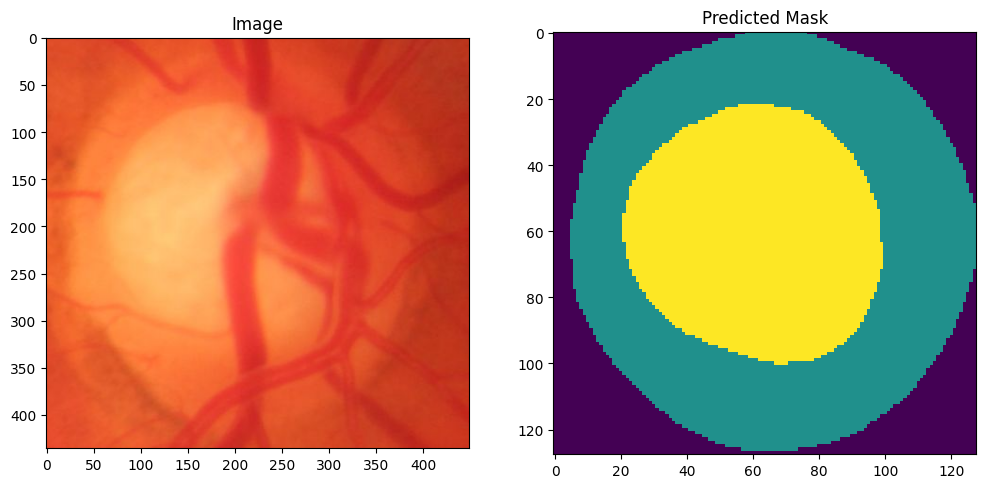

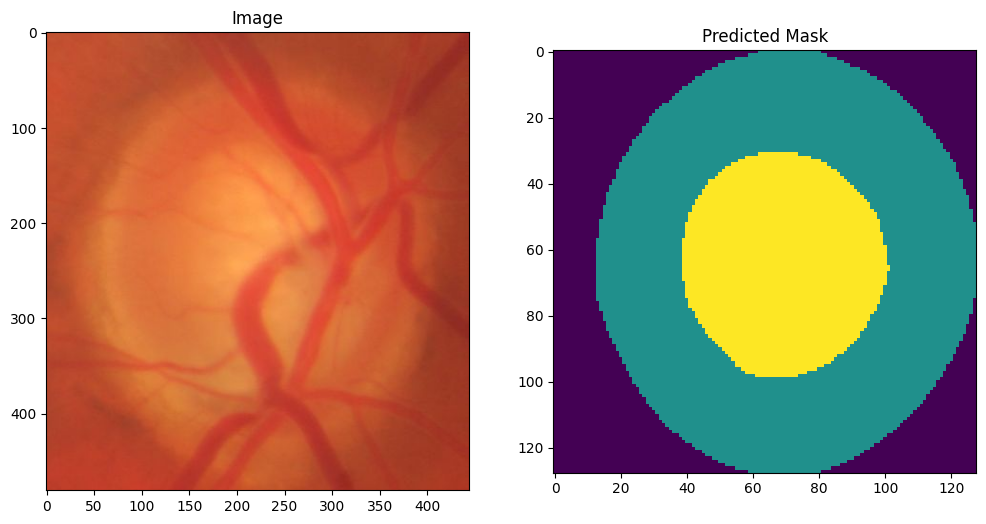

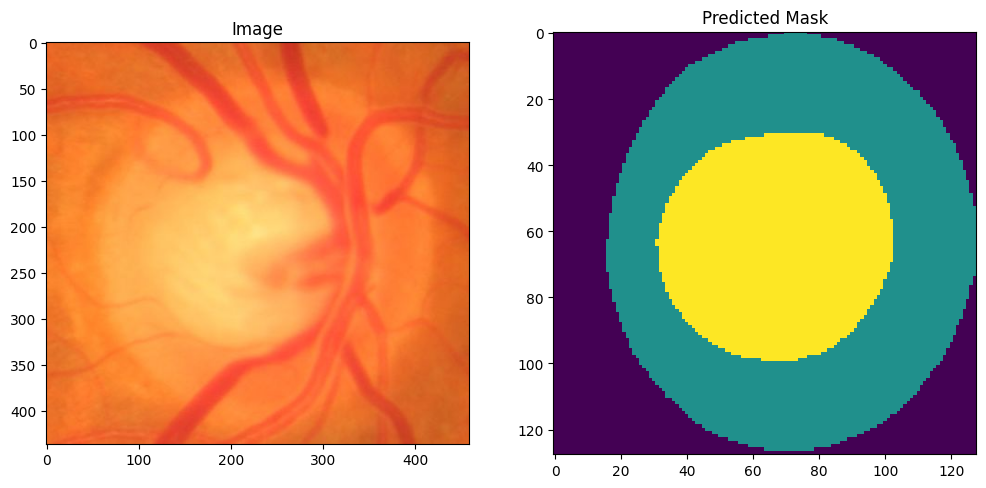

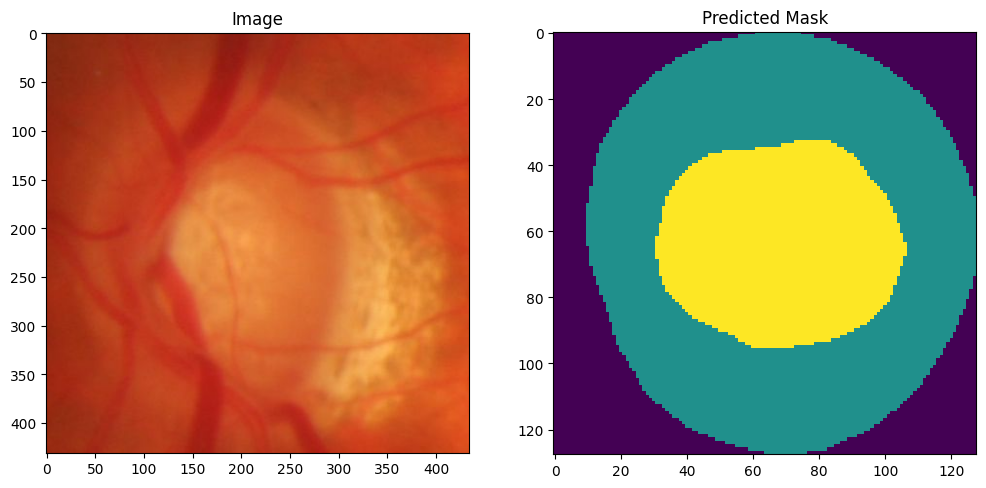

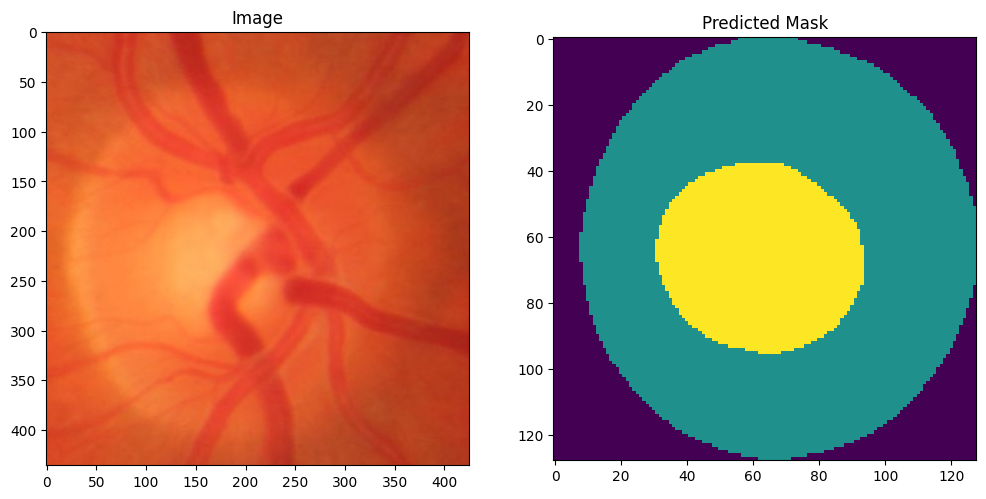

...

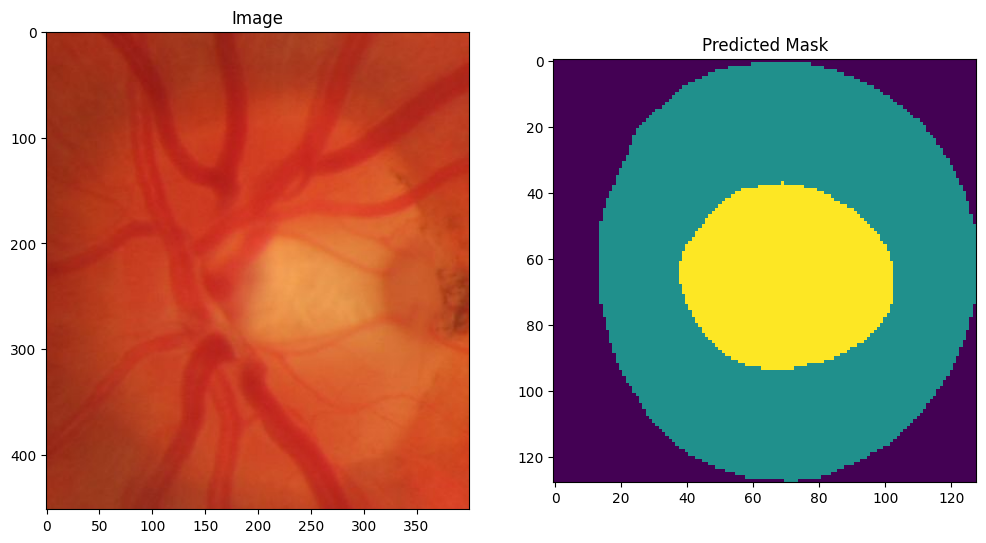

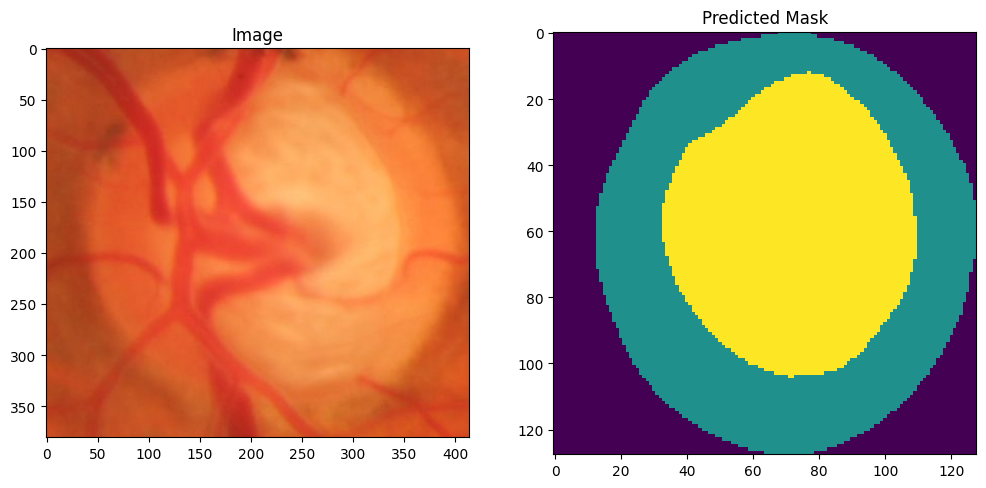

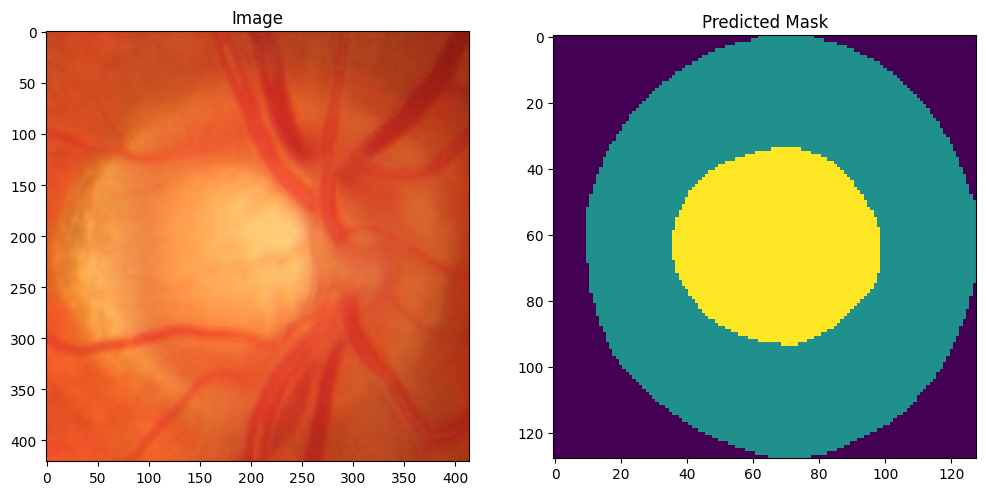

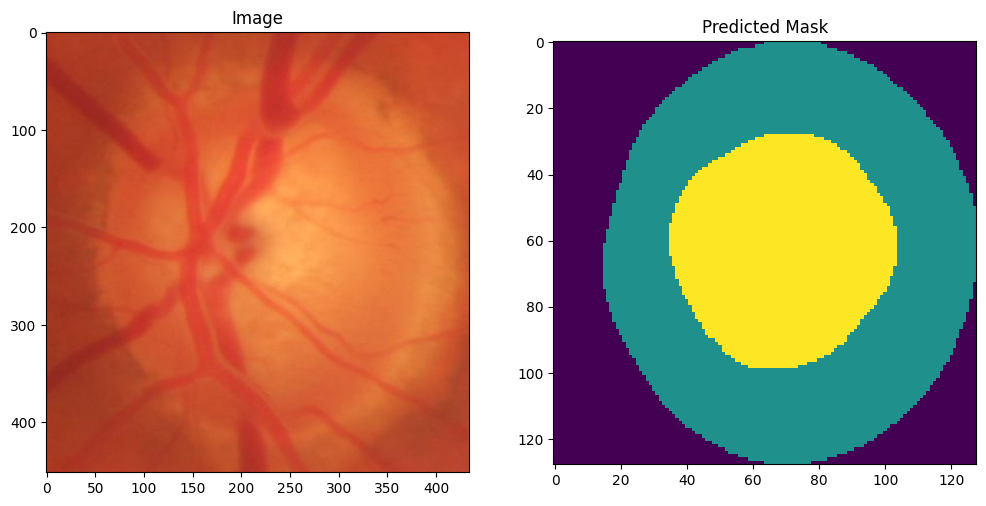

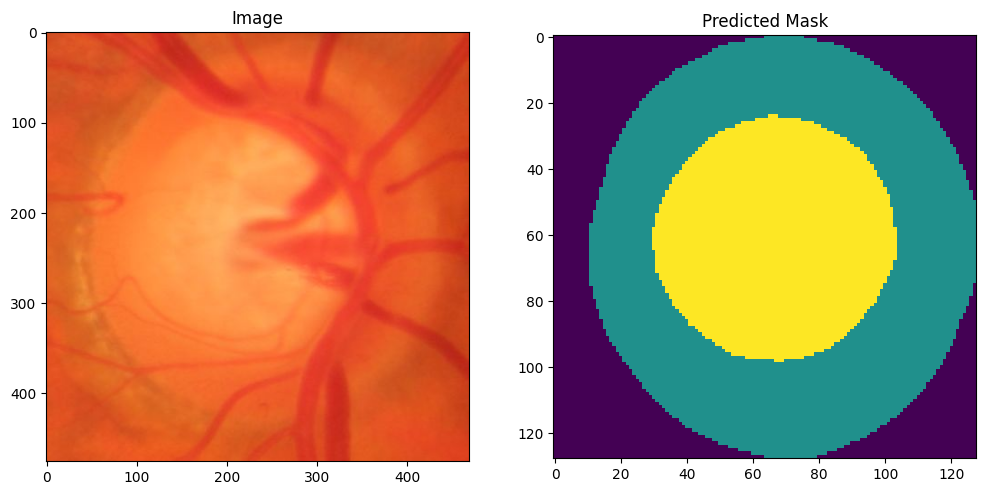

In [ ]:
# Import necessary libraries
from keras.models import load_model
import os
import glob
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Load the trained model
model = load_model('/content/drive/MyDrive/Colab Notebooks/Project Implementation/Experiment 1/Saved model/UNET_Resnet34_ORIGA&REFUGE_with_Aug_V2_with_1248_without_denoising_Epoch_40_batch_16.hdf5', compile=False)

# Load the new dataset
new_image_names = glob.glob("/content/drive/MyDrive/Colab Notebooks/Project Implementation/HRF_Data cleaning/HRF_Cropped/glaucoma/*.jpg")
new_images = [cv2.imread(image, 1) for image in new_image_names]

# Apply resize
new_width = 128
new_height = 128
dim = (new_width, new_height)
resized_images = [cv2.resize(image, dim, interpolation=cv2.INTER_AREA) for image in new_images]

# Preprocess the new images
new_image_dataset = np.array(resized_images)
new_image_dataset = new_image_dataset / 255.

# Make predictions on the new dataset
new_predictions = model.predict(new_image_dataset)
new_predictions_argmax = np.argmax(new_predictions, axis=3)

# Save the predicted masks with the same name as the original images
output_path = "/content/drive/MyDrive/Colab Notebooks/Project Implementation/HRF_Data cleaning/HRF_after_segmentation/glaucoma/"
for i, prediction in enumerate(new_predictions_argmax):
    image_name = os.path.basename(new_image_names[i])
    mask_name = os.path.splitext(image_name)[0] + "_mask.png"
    #cv2.imwrite(output_path + mask_name, prediction)

# Visualize some images with their corresponding masks
num_images_to_visualize = 15
for i in range(num_images_to_visualize):
    plt.figure(figsize=(12, 8))
    plt.subplot(121)
    plt.title('Image')
    plt.imshow(cv2.cvtColor(new_images[i],cv2.COLOR_BGR2RGB)) #I add here
    plt.subplot(122)
    plt.title('Predicted Mask')
    plt.imshow(new_predictions_argmax[i])
    plt.show()


1/1 [==============================] - 1s 779ms/step


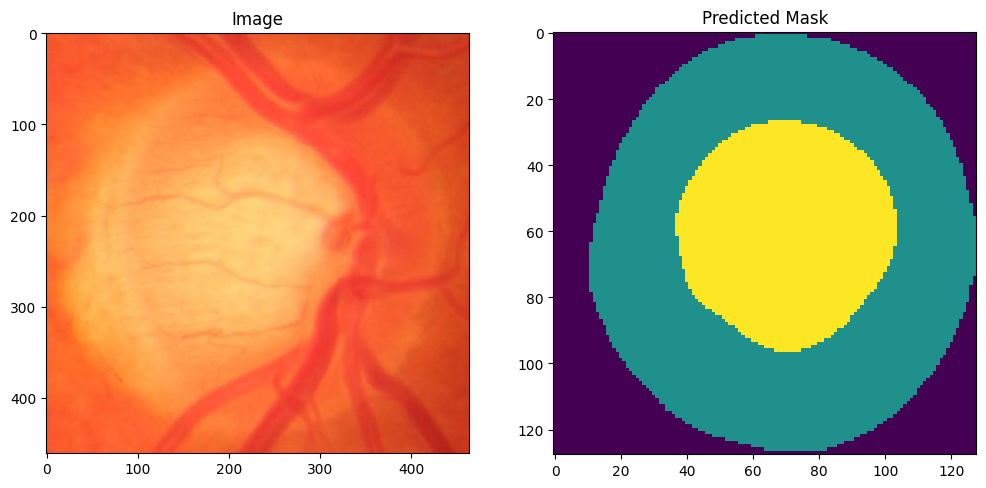

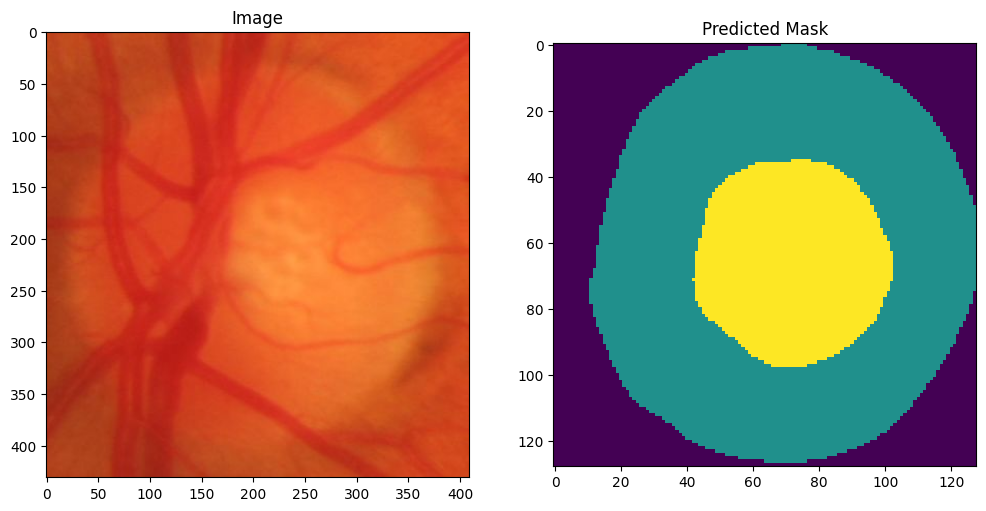

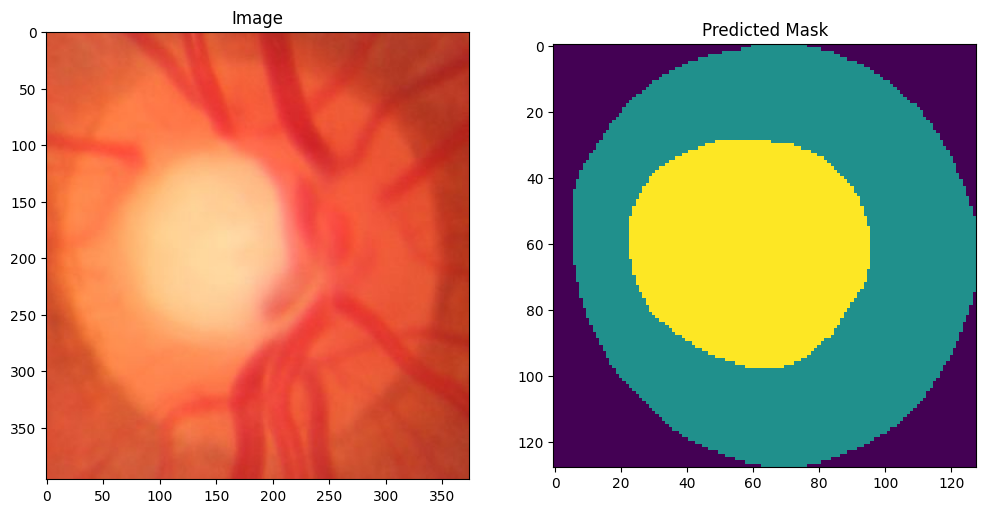

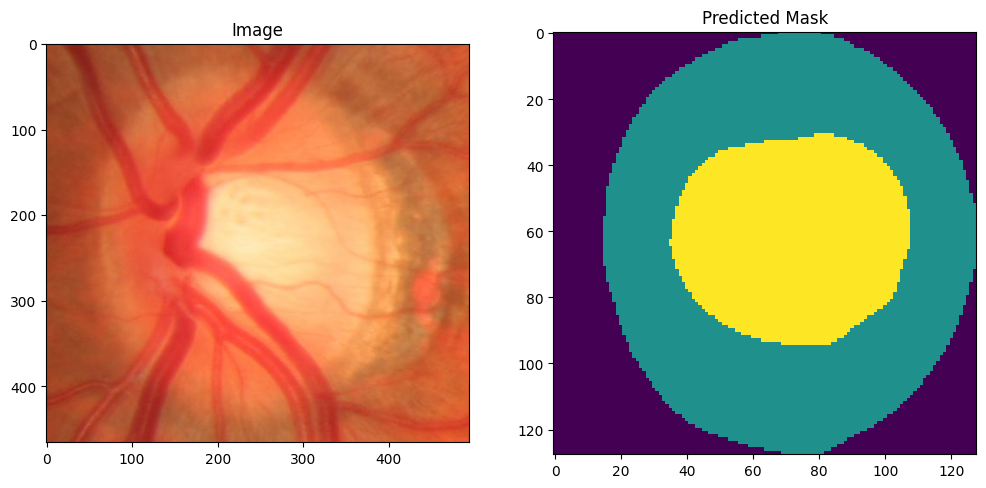

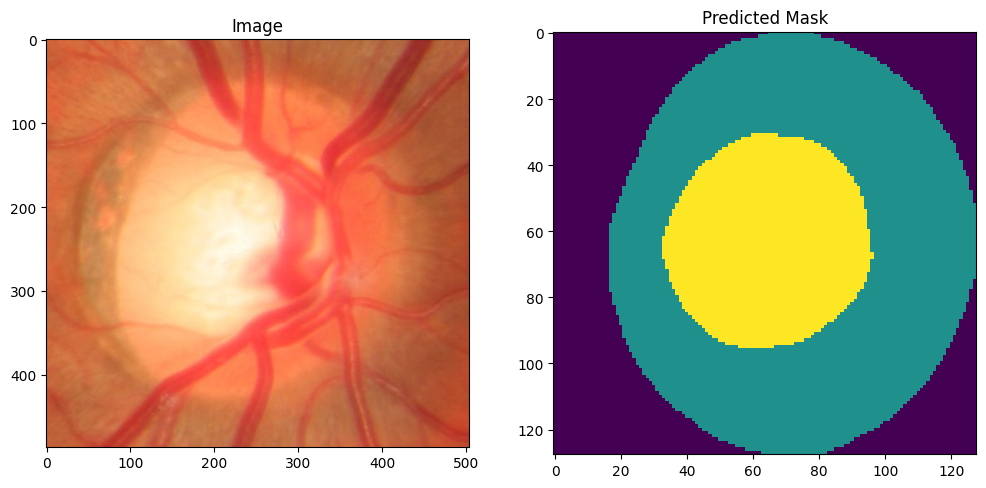

...

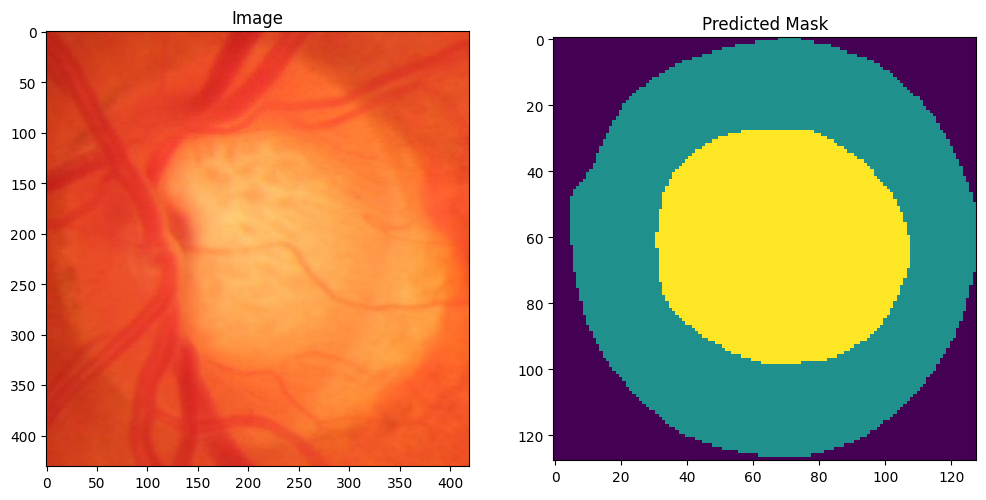

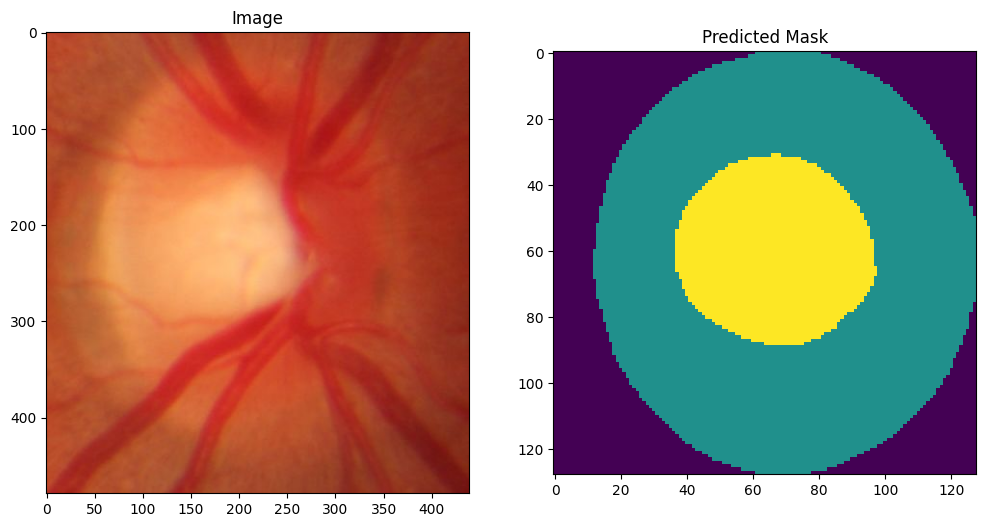

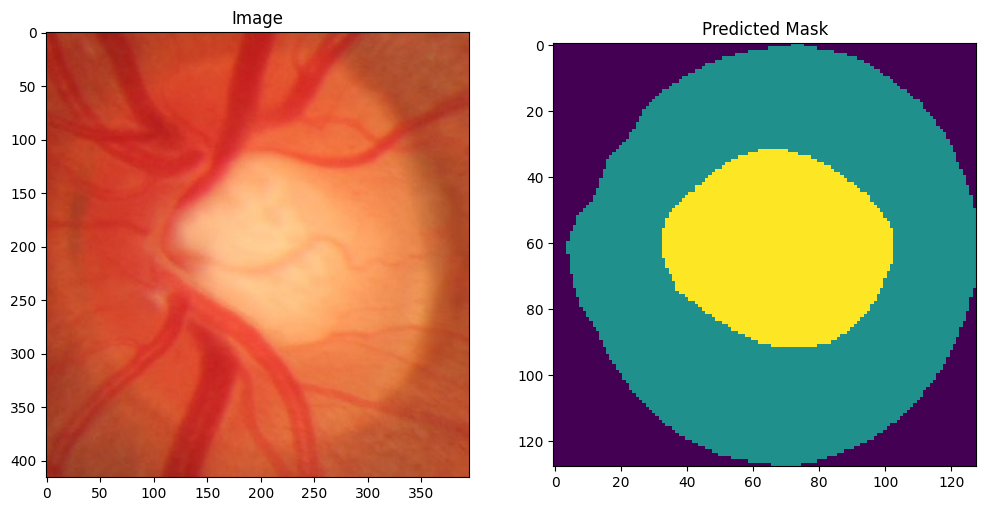

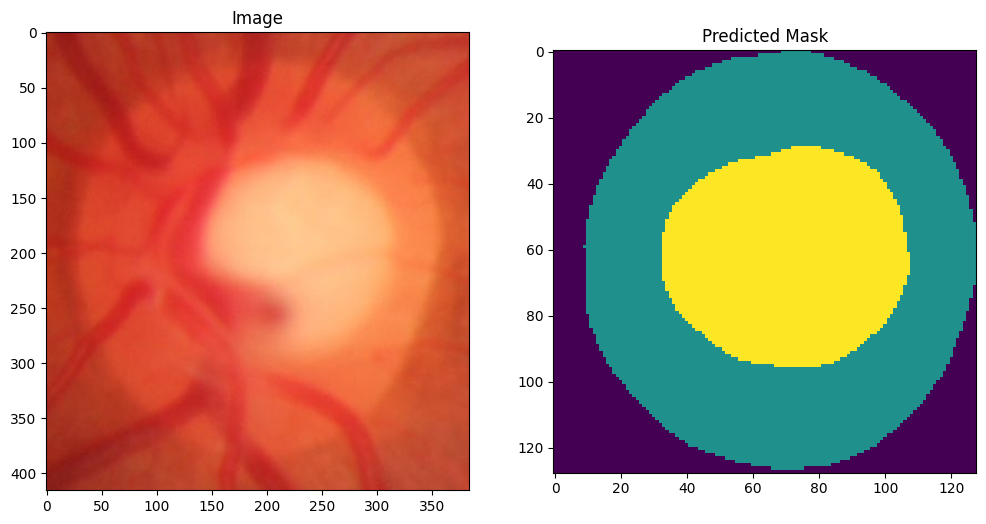

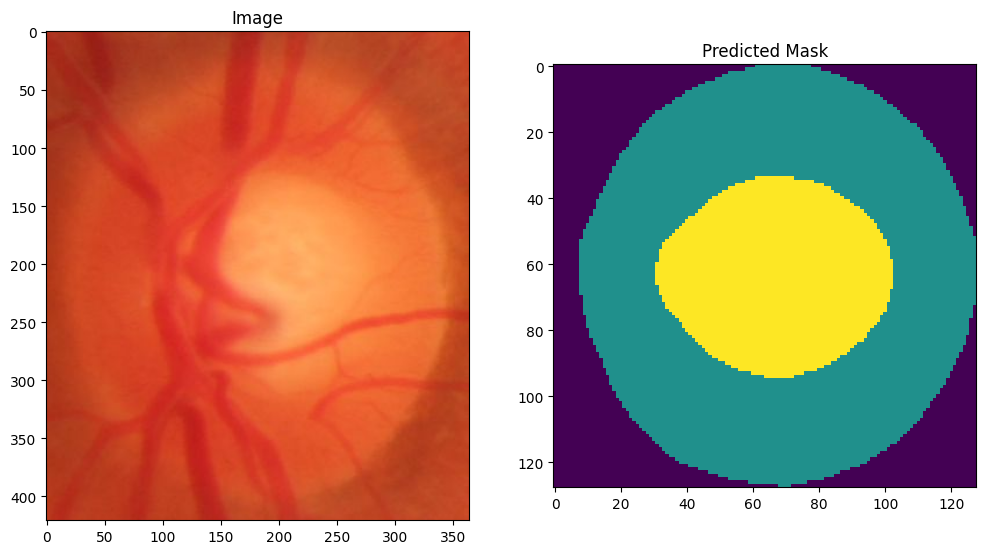

In [ ]:
#good // Resnet 34 Epoch_40 batch 16
from keras.models import load_model
import os
import glob
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Load the trained model
model = load_model('/content/drive/MyDrive/Colab Notebooks/Project Implementation/Experiment 1/Saved model/UNET_Resnet34_ORIGA&REFUGE_with_Aug_V2_with_1248_without_denoising_Epoch_40_batch_16.hdf5', compile=False)

# Load the new dataset
new_image_names = glob.glob("/content/drive/MyDrive/Colab Notebooks/Project Implementation/HRF_Data cleaning/HRF_Cropped/normal/*.jpg")
new_images = [cv2.imread(image, 1) for image in new_image_names]

# Apply resize
new_width = 128
new_height = 128
dim = (new_width, new_height)
resized_images = [cv2.resize(image, dim, interpolation=cv2.INTER_AREA) for image in new_images]

# Preprocess the new images
new_image_dataset = np.array(resized_images)
new_image_dataset = new_image_dataset / 255.

# Make predictions on the new dataset
new_predictions = model.predict(new_image_dataset)
new_predictions_argmax = np.argmax(new_predictions, axis=3)

# Save the predicted masks with the same name as the original images
output_path = "/content/drive/MyDrive/Colab Notebooks/Project Implementation/HRF_Data cleaning/HRF_after_segmentation/normal/"
for i, prediction in enumerate(new_predictions_argmax):
    image_name = os.path.basename(new_image_names[i])
    mask_name = os.path.splitext(image_name)[0] + "_mask.png"
    #cv2.imwrite(output_path + mask_name, prediction)

# Visualize some images with their corresponding masks
num_images_to_visualize = 15
for i in range(num_images_to_visualize):
    plt.figure(figsize=(12, 8))
    plt.subplot(121)
    plt.title('Image')
    plt.imshow(cv2.cvtColor(new_images[i],cv2.COLOR_BGR2RGB)) #I add here
    plt.subplot(122)
    plt.title('Predicted Mask')
    plt.imshow(new_predictions_argmax[i])
    plt.show()


# **Segmentation**
Experiment 2

Dataset:ORIGA&RIM-ONE DL

In [ ]:
# Import necessary libraries
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
# Install necessary packages
!pip install tensorflow==2.12
!pip install keras==2.12
!pip install -U segmentation-models

In [ ]:
#Import necessary libraries
import keras
import tensorflow as tf
print(keras.__version__)
print(tf.__version__)

In [ ]:
import os
os.environ["SM_FRAMEWORK"] = "tf.keras"

from tensorflow import keras

In [ ]:
import segmentation_models as sm

In [ ]:

import glob
import cv2
import numpy as np
from matplotlib import pyplot as plt

In [ ]:
'''
# Function to apply denoising to an image using either a Gaussian filter or a median filter
def denoise_image(image, filter_type='gaussian', filter_size=3):
    if filter_type == 'gaussian':
        denoised_image = cv2.GaussianBlur(image, (filter_size, filter_size), 0)
    elif filter_type == 'median':
        denoised_image = cv2.medianBlur(image, filter_size)
    else:
        raise ValueError("Invalid filter_type. Choose 'gaussian' or 'median'.")

    return denoised_image

'''

In [ ]:
#Resizing images, if needed

SIZE_X = 128
SIZE_Y = 128

n_classes=3 #Number of classes for segmentation
num_images = 2040  #Total 680 available //augmentation v1 1360 // V2 - 2040

In [ ]:
# Load image and mask names
image_names = glob.glob("/content/drive/MyDrive/Colab Notebooks/Project Implementation/New_Experiments/ORIGA&RIMONEDL_after_augmentation_version_2/Images/*.png")
image_names.sort()
image_names_subset = image_names[0:num_images]
images = [cv2.imread(image, 1) for image in image_names_subset] #SM backbones use 3 channel images, so let us read images in color.

In [ ]:
#Convert the list of  images to a numpy array
image_dataset = np.array(images)

In [ ]:
mask_names = glob.glob("/content/drive/MyDrive/Colab Notebooks/Project Implementation/New_Experiments/ORIGA&RIMONEDL_after_augmentation_version_2/Masks/*.png")
mask_names.sort()
mask_names_subset = mask_names[0:num_images]
masks = [cv2.imread(mask, 0) for mask in mask_names_subset]

In [ ]:
#Convert the list of masks to a numpy array
mask_dataset = np.array(masks)

In [ ]:
# Print some information about the dataset
print("Total images in the original dataset are: ", len(image_names))
print("Image data shape is: ", image_dataset.shape)
print("Mask data shape is: ", mask_dataset.shape)
print("Max pixel value in image is: ", image_dataset.max())
print("Labels in the mask are : ", np.unique(mask_dataset))

Total images in the original dataset are:  2040
Image data shape is:  (2040, 128, 128, 3)
Mask data shape is:  (2040, 128, 128)
Max pixel value in image is:  255
Labels in the mask are :  [0 1 2]


In [ ]:
#Encode labels to 0, 1, 2, 3, ... but multi dim array so need to flatten, encode and reshape
from sklearn.preprocessing import LabelEncoder
labelencoder = LabelEncoder()
n, h, w = mask_dataset.shape
mask_dataset_reshaped = mask_dataset.reshape(-1,1)
mask_dataset_reshaped_encoded = labelencoder.fit_transform(mask_dataset_reshaped)
mask_dataset_encoded = mask_dataset_reshaped_encoded.reshape(n, h, w)

np.unique(mask_dataset_encoded)

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:116: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


array([0, 1, 2])

In [ ]:
mask_dataset_encoded = np.expand_dims(mask_dataset_encoded, axis = 3)
print(mask_dataset_encoded.shape)


(2040, 128, 128, 1)


In [ ]:
#Split training data
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(image_dataset, mask_dataset_encoded, test_size = 0.2, random_state = 42)

In [ ]:
from tensorflow.keras.utils import to_categorical
train_masks_cat = to_categorical(y_train, num_classes=n_classes)
y_train_cat = train_masks_cat.reshape((y_train.shape[0], y_train.shape[1], y_train.shape[2], n_classes))

test_masks_cat = to_categorical(y_test, num_classes=n_classes)
y_test_cat = test_masks_cat.reshape((y_test.shape[0], y_test.shape[1], y_test.shape[2], n_classes))

In [ ]:
print(y_train_cat.shape)

(1632, 128, 128, 3)


In [ ]:
#Reused parameters in all models
import tensorflow
n_classes=3
activation='softmax'

LR = 0.0001
optim = tensorflow.keras.optimizers.Adam(LR)

# Segmentation models losses can be combined together by '+' and scaled by integer or float factor
dice_loss = sm.losses.DiceLoss()
focal_loss = sm.losses.CategoricalFocalLoss()
total_loss = dice_loss + (1 * focal_loss)

# actulally total_loss can be imported directly from library, above example just show you how to manipulate with losses
# total_loss = sm.losses.binary_focal_dice_loss # or sm.losses.categorical_focal_dice_loss

metrics = [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5)]

In [ ]:
###Model
BACKBONE = 'resnet34'
#BACKBONE = 'resnet50'
#BACKBONE = 'vgg19'
#BACKBONE = 'efficientnetb0'
#BACKBONE = 'densenet121'
preprocess_input = sm.get_preprocessing(BACKBONE)

# preprocess input
X_train_processed = preprocess_input(X_train)
X_test_processed = preprocess_input(X_test)

In [ ]:
#images
# define model
model = sm.Unet(BACKBONE, encoder_weights='imagenet', classes=n_classes, activation=activation)

# compile keras model with defined optimozer, loss and metrics
model.compile(optim, total_loss, metrics=metrics)

#model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=metrics)

print(model.summary())

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 data (InputLayer)              [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 bn_data (BatchNormalization)   (None, None, None,   9           ['data[0][0]']                   
                                3)                                                                
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, None, None,   0          ['bn_data[0][0]']                
                                3)                                                          

In [ ]:
#batch_size= 16
#epochs=50,
#Resnet34
#ORIGA & RIM ONE DL
#With augmentation_ v2_ 2040 , without denoising

# Train the model
history=model.fit(X_train_processed,
          y_train_cat,
          batch_size=16,
          epochs=50,
          verbose=1,
          validation_data=(X_test_processed, y_test_cat))


Epoch 1/50
102/102 [==============================] - 40s 109ms/step - loss: 0.3210 - iou_score: 0.6741 - f1-score: 0.7797 - val_loss: 0.4727 - val_iou_score: 0.5227 - val_f1-score: 0.6849
Epoch 2/50
102/102 [==============================] - 9s 91ms/step - loss: 0.1124 - iou_score: 0.8816 - f1-score: 0.9367 - val_loss: 0.5683 - val_iou_score: 0.3939 - val_f1-score: 0.5419
Epoch 3/50
102/102 [==============================] - 9s 91ms/step - loss: 0.0788 - iou_score: 0.9096 - f1-score: 0.9524 - val_loss: 0.6843 - val_iou_score: 0.3536 - val_f1-score: 0.4598
Epoch 4/50
102/102 [==============================] - 9s 93ms/step - loss: 0.0634 - iou_score: 0.9228 - f1-score: 0.9597 - val_loss: 0.7140 - val_iou_score: 0.3224 - val_f1-score: 0.4339
Epoch 5/50
102/102 [==============================] - 10s 94ms/step - loss: 0.0550 - iou_score: 0.9304 - f1-score: 0.9638 - val_loss: 0.7071 - val_iou_score: 0.3253 - val_f1-score: 0.4407
Epoch 6/50
102/102 [==============================] - 10s 95ms

In [ ]:
# Save the model
model.save('/content/drive/MyDrive/Colab Notebooks/Project Implementation/New_Experiments/Saved_model/Segmentation_UNET_Resnet34_ORIGA&RIMONEDL_with_Aug_V2_2040_without_denoising_Epoch_50_batch_16.hdf5')

In [ ]:
import pickle

# Save the history as a pickle file
with open('/content/drive/MyDrive/Colab Notebooks/Project Implementation/New_Experiments/Saved_history/Segmentation_UNET_Resnet34_ORIGA&RIMONEDL_with_Aug_V2_2040_without_denoising_Epoch_50_batch_16_history.pkl', 'wb') as file:
    pickle.dump(history.history, file)

In [ ]:
#plot the training and validation accuracy and loss at each epoch
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

acc = history.history['iou_score']
val_acc = history.history['val_iou_score']

plt.plot(epochs, acc, 'y', label='Training IOU')
plt.plot(epochs, val_acc, 'r', label='Validation IOU')
plt.title('Training and validation IOU')
plt.xlabel('Epochs')
plt.ylabel('IOU')
plt.legend()
plt.show()

In [ ]:
from keras.models import load_model

### FOR NOW LET US FOCUS ON A SINGLE MODEL

#Set compile=False as we are not loading it for training, only for prediction.
model = load_model('/content/drive/MyDrive/Colab Notebooks/Project Implementation/New_Experiments/Saved_model/Segmentation_UNET_Resnet34_ORIGA&RIMONEDL_with_Aug_V2_2040_without_denoising_Epoch_50_batch_16.hdf5', compile=False)

In [ ]:
#IOU
from keras.metrics import MeanIoU
y_pred=model.predict(X_test_processed)
y_pred_argmax=np.argmax(y_pred, axis=3)

In [ ]:
#mIoU
n_classes = 3
IOU_keras = MeanIoU(num_classes=n_classes)
IOU_keras.update_state(y_test[:,:,:,0], y_pred_argmax)
print("Mean IoU =", IOU_keras.result().numpy())

Mean IoU = 0.98035127


In [ ]:

#To calculate I0U for each class...
values = np.array(IOU_keras.get_weights()).reshape(n_classes, n_classes)
print(values)
class1_IoU = values[0,0]/(values[0,0] + values[0,1] + values[0,2] + values[1,0]+ values[2,0])
class2_IoU = values[1,1]/(values[1,1] + values[1,0] + values[1,2] + values[0,1]+ values[2,1])
class3_IoU = values[2,2]/(values[2,2] + values[2,0] + values[2,1] + values[0,2]+ values[1,2])

print("IoU for class1 is: ", class1_IoU)
print("IoU for class2 is: ", class2_IoU)
print("IoU for class3 is: ", class3_IoU)

#



[[1.872281e+06 1.600400e+04 4.000000e+00]
 [2.069800e+04 2.594922e+06 1.101100e+04]
 [0.000000e+00 2.007900e+04 2.149673e+06]]
IoU for class1 is:  0.980772
IoU for class2 is:  0.97454023
IoU for class3 is:  0.98574173


In [ ]:
# Import the random library
import random
# Generate a random index for the test dataset
img_number = random.randint(0, len(X_test_processed)-1)
# Get the image, mask, and prediction at the randomly generated index
img = X_test_processed[img_number]
mask = y_test[img_number]
prediction = y_pred_argmax[img_number]

# Create a new figure with a specified size
plt.figure(figsize=(12, 8))
# Create a subplot for the image
plt.subplot(231)
plt.title('Image')
plt.imshow(img, cmap='gray')
plt.subplot(232)
plt.title('Mask')
plt.imshow(mask[:,:,0])
# Create a subplot for the prediction
plt.subplot(233)
plt.title('Prediction')
plt.imshow(prediction)
# Show the figure
plt.show()

# **To test the model on the HRF datast**

1/1 [==============================] - 1s 775ms/step


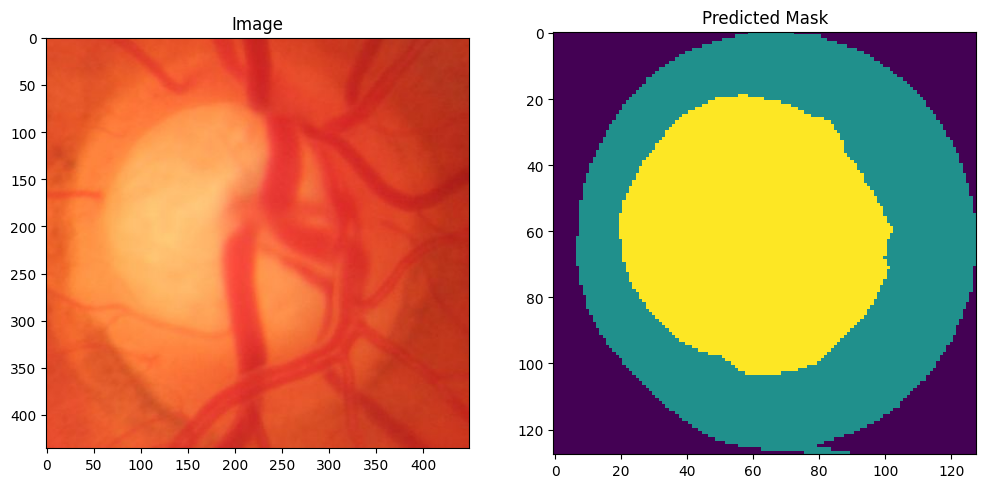

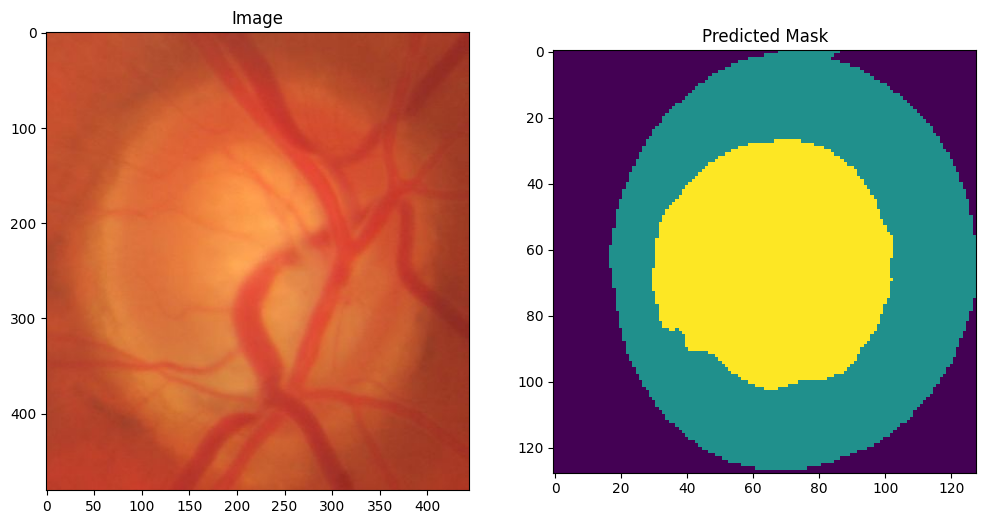

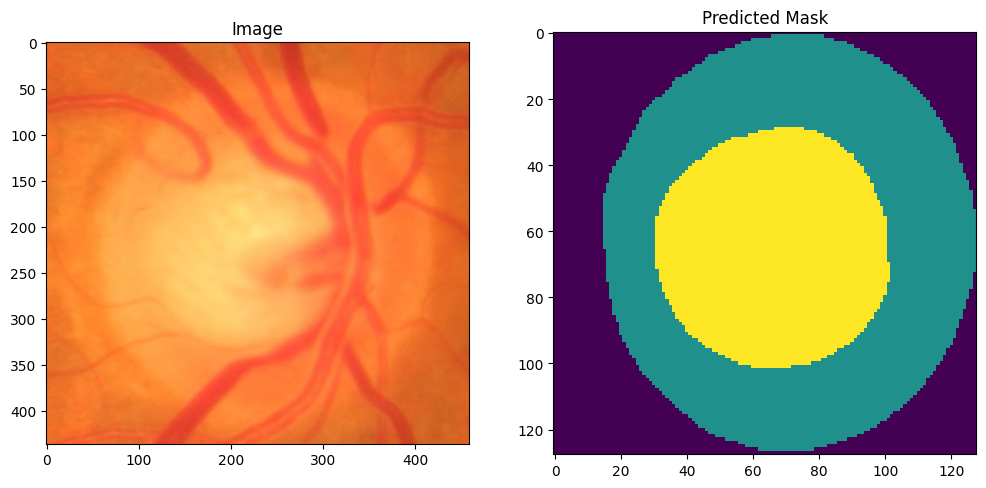

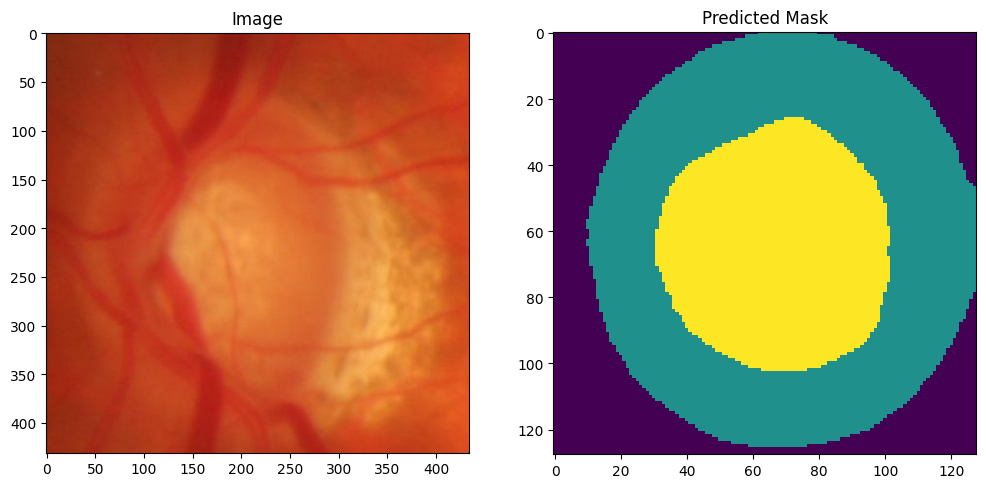

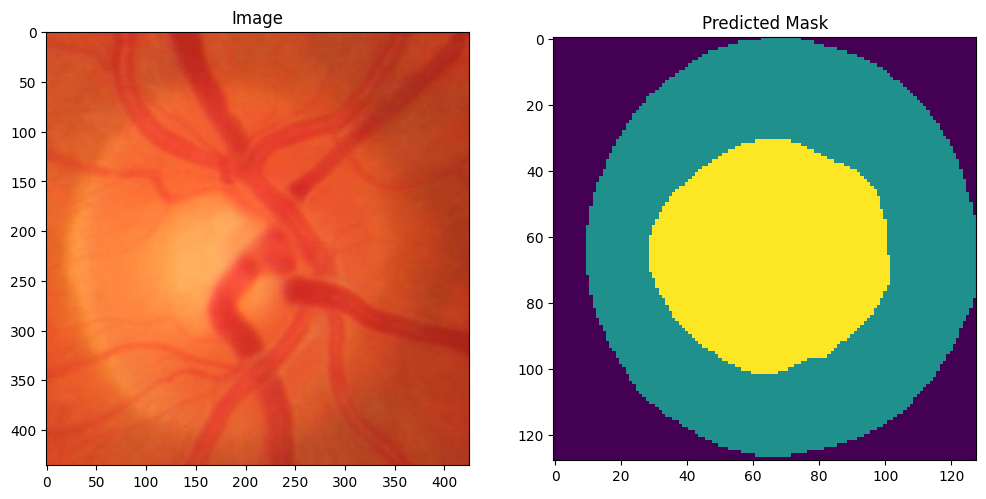

...

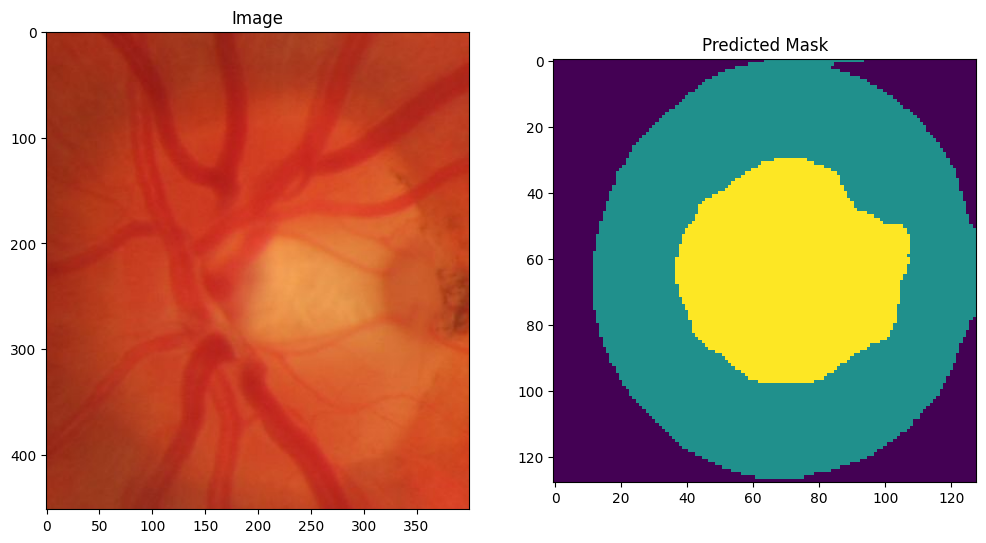

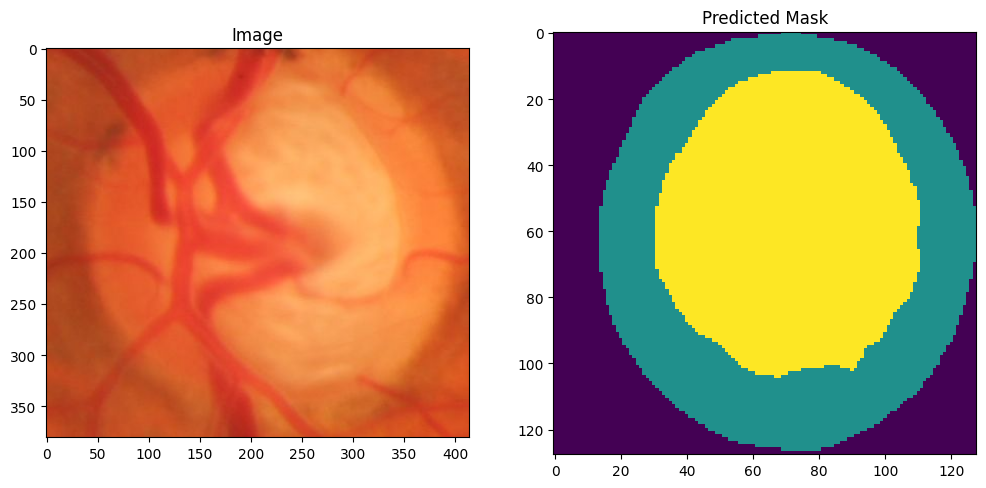

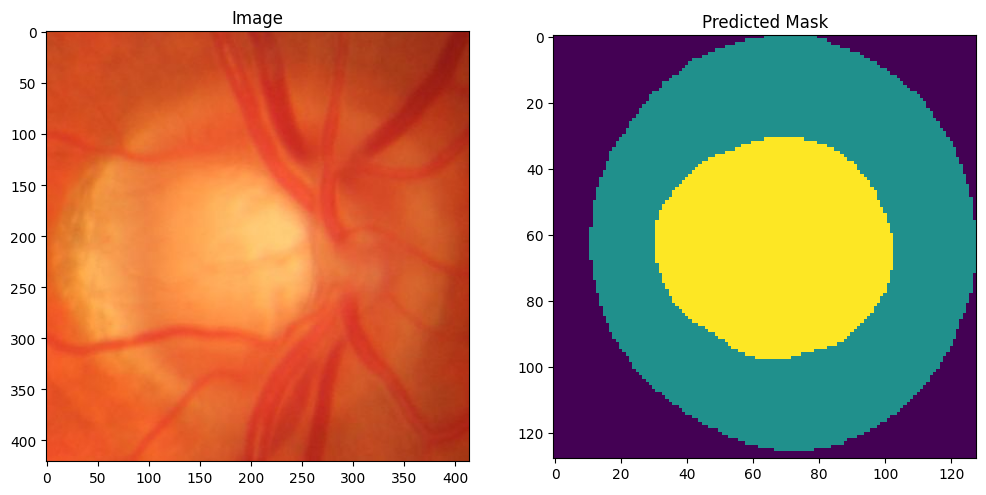

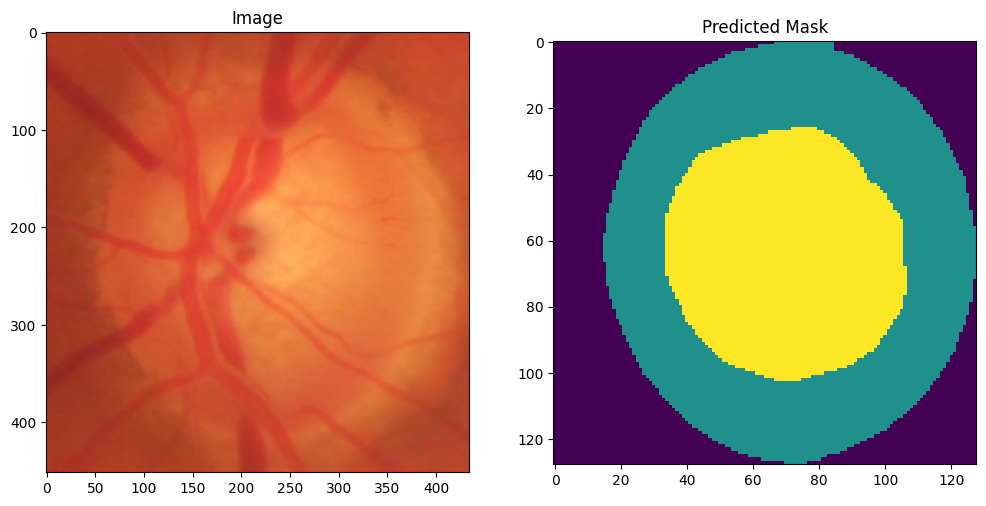

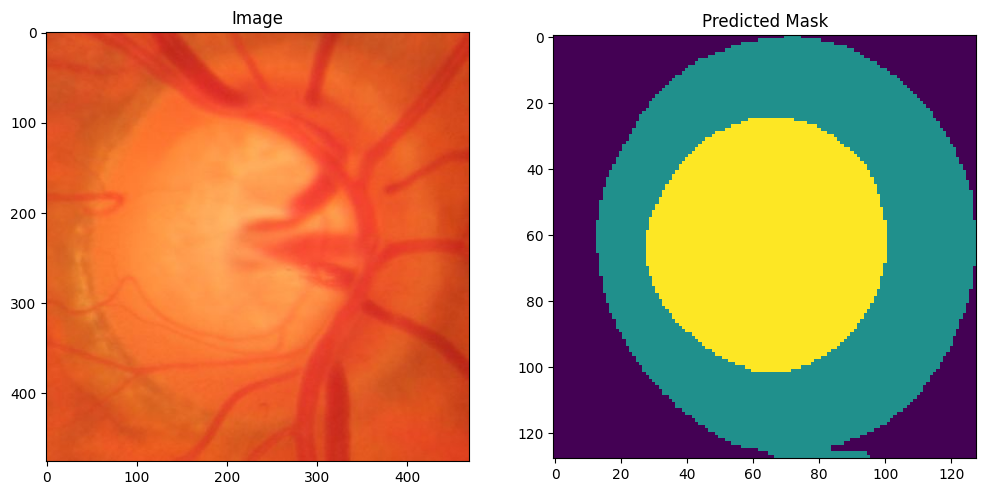

In [ ]:
# Import necessary libraries
from keras.models import load_model
import os
import glob
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Load the trained model
model = load_model('/content/drive/MyDrive/Colab Notebooks/Project Implementation/New_Experiments/Saved_model/Segmentation_UNET_Resnet34_ORIGA&RIMONEDL_with_Aug_V2_2040_without_denoising_Epoch_50_batch_16.hdf5', compile=False)

# Load the new dataset
new_image_names = glob.glob("/content/drive/MyDrive/Colab Notebooks/Project Implementation/HRF_Data cleaning/HRF_Cropped/glaucoma/*.jpg")
new_images = [cv2.imread(image, 1) for image in new_image_names]

# Apply resize
new_width = 128
new_height = 128
dim = (new_width, new_height)
resized_images = [cv2.resize(image, dim, interpolation=cv2.INTER_AREA) for image in new_images]

# Preprocess the new images
new_image_dataset = np.array(resized_images)
new_image_dataset = new_image_dataset / 255.

# Make predictions on the new dataset
new_predictions = model.predict(new_image_dataset)
new_predictions_argmax = np.argmax(new_predictions, axis=3)

# Save the predicted masks with the same name as the original images
output_path = "/content/drive/MyDrive/Colab Notebooks/Project Implementation/HRF_Data cleaning/HRF_after_segmentation/glaucoma/"
for i, prediction in enumerate(new_predictions_argmax):
    image_name = os.path.basename(new_image_names[i])
    mask_name = os.path.splitext(image_name)[0] + "_mask.png"
    #cv2.imwrite(output_path + mask_name, prediction)

# Visualize some images with their corresponding masks
num_images_to_visualize = 15
for i in range(num_images_to_visualize):
    plt.figure(figsize=(12, 8))
    plt.subplot(121)
    plt.title('Image')
    plt.imshow(cv2.cvtColor(new_images[i],cv2.COLOR_BGR2RGB)) #I add here
    plt.subplot(122)
    plt.title('Predicted Mask')
    plt.imshow(new_predictions_argmax[i])
    plt.show()


1/1 [==============================] - 10s 10s/step


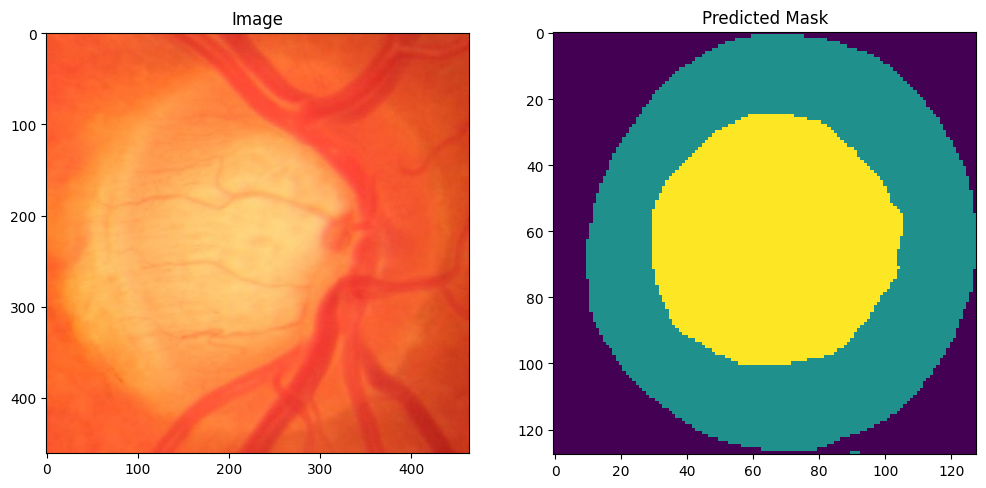

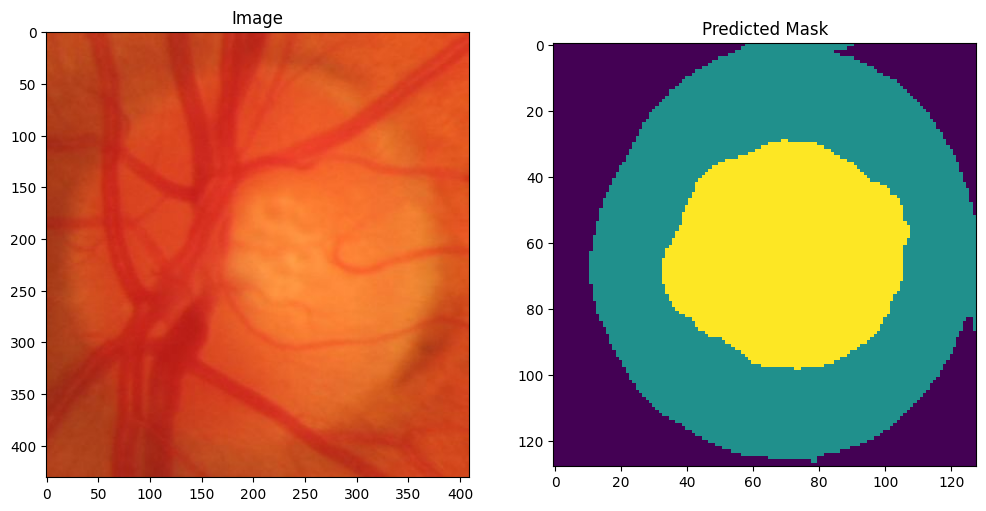

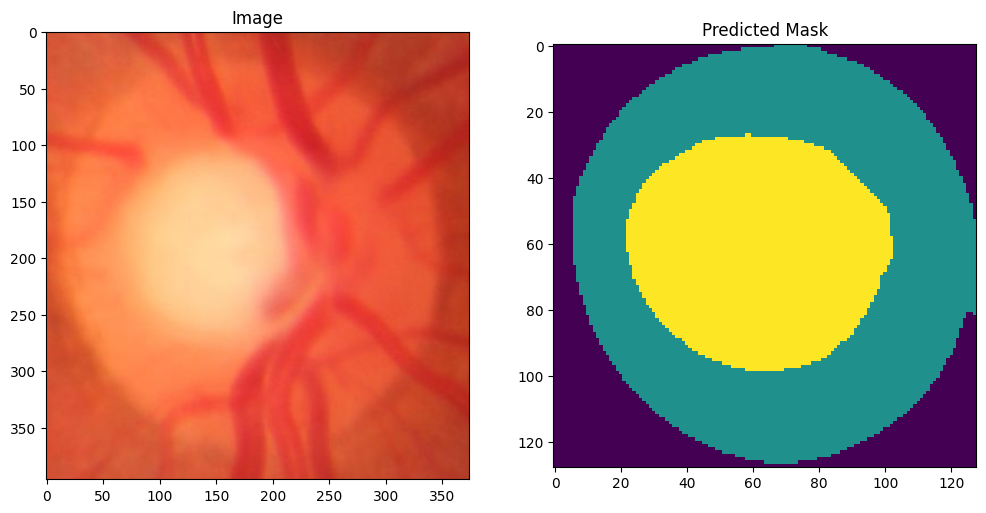

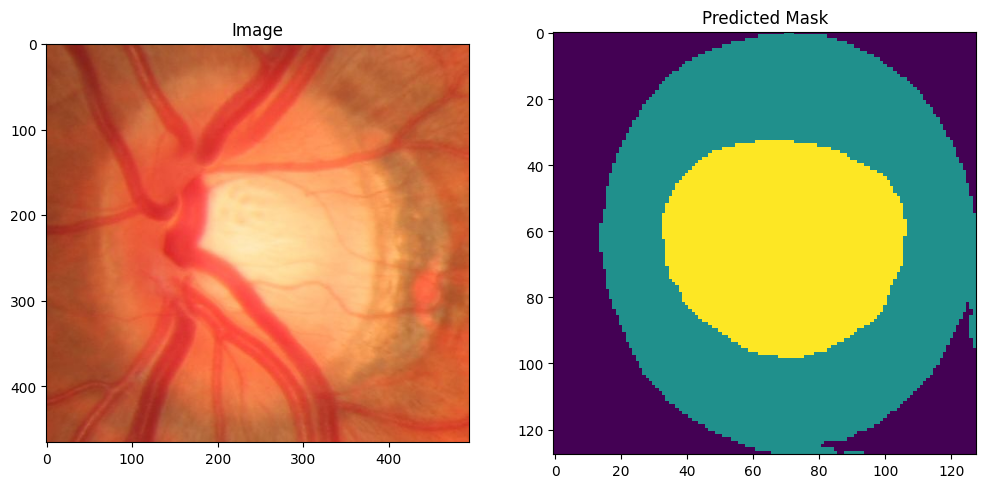

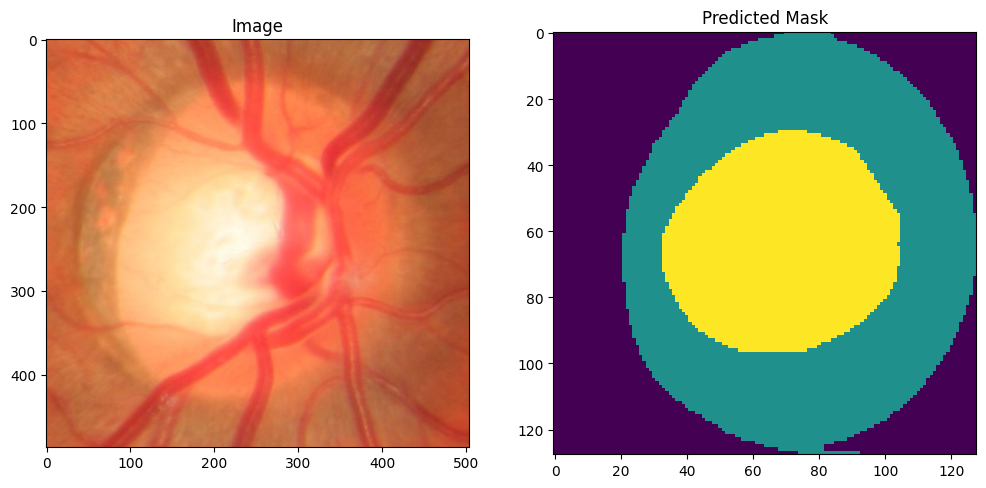

...

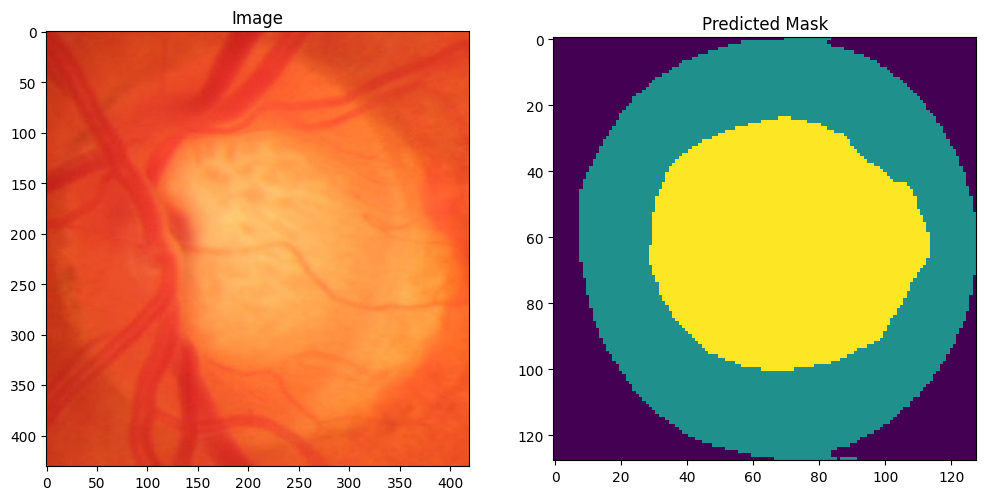

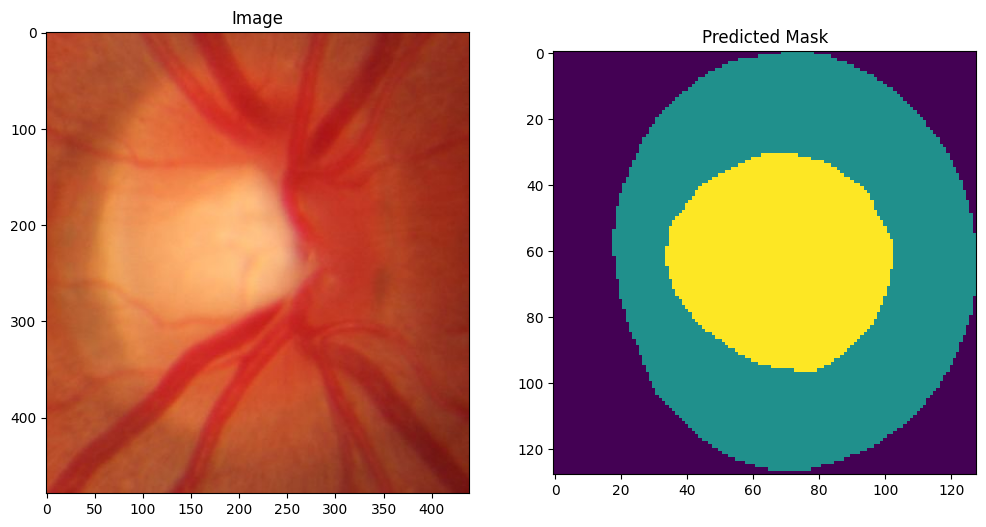

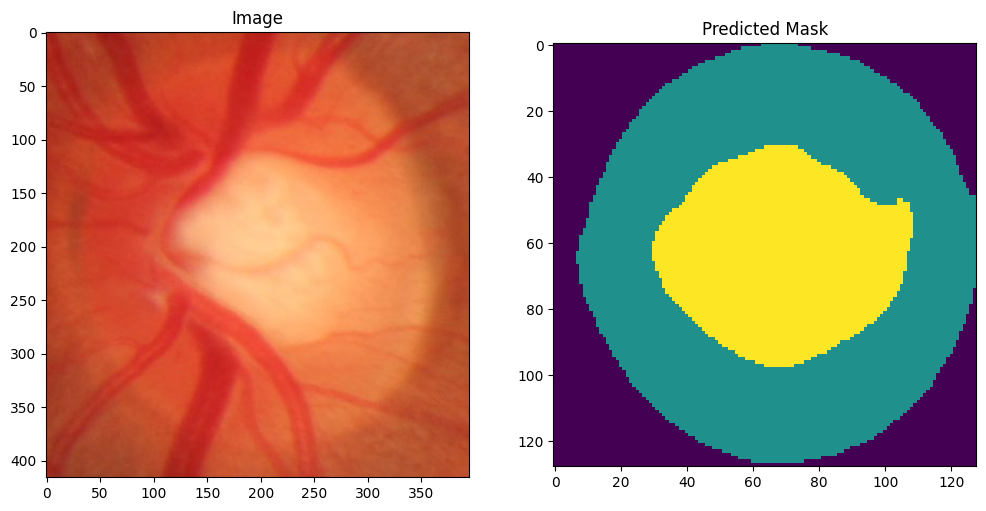

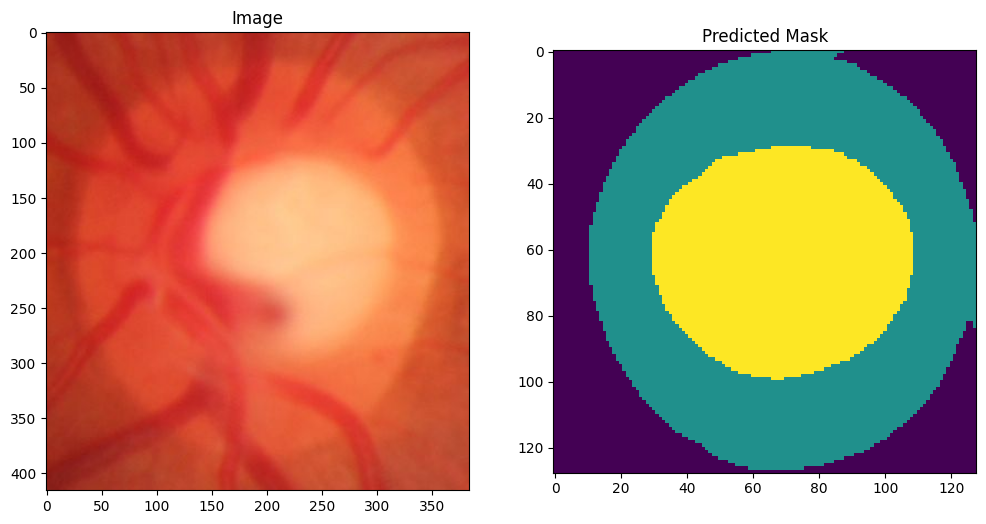

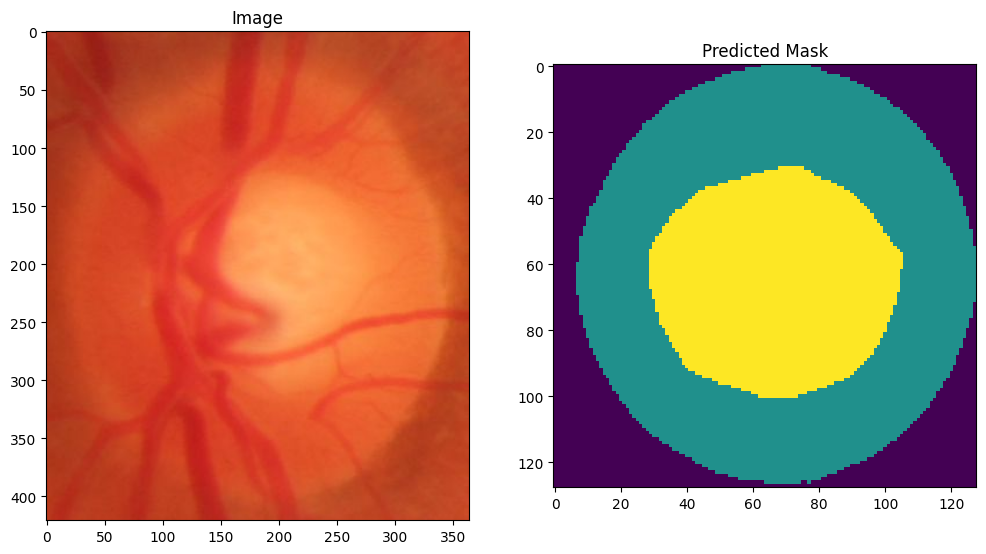

In [ ]:
# Import necessary libraries
from keras.models import load_model
import os
import glob
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Load the trained model
model = load_model('/content/drive/MyDrive/Colab Notebooks/Project Implementation/New_Experiments/Saved_model/Segmentation_UNET_Resnet34_ORIGA&RIMONEDL_with_Aug_V2_2040_without_denoising_Epoch_50_batch_16.hdf5', compile=False)

# Load the new dataset
new_image_names = glob.glob("/content/drive/MyDrive/Colab Notebooks/Project Implementation/HRF_Data cleaning/HRF_Cropped/normal/*.jpg")
new_images = [cv2.imread(image, 1) for image in new_image_names]

# Apply resize
new_width = 128
new_height = 128
dim = (new_width, new_height)
resized_images = [cv2.resize(image, dim, interpolation=cv2.INTER_AREA) for image in new_images]

# Preprocess the new images
new_image_dataset = np.array(resized_images)
new_image_dataset = new_image_dataset / 255.

# Make predictions on the new dataset
new_predictions = model.predict(new_image_dataset)
new_predictions_argmax = np.argmax(new_predictions, axis=3)

# Save the predicted masks with the same name as the original images
output_path = "/content/drive/MyDrive/Colab Notebooks/Project Implementation/HRF_Data cleaning/HRF_after_segmentation/normal/"
for i, prediction in enumerate(new_predictions_argmax):
    image_name = os.path.basename(new_image_names[i])
    mask_name = os.path.splitext(image_name)[0] + "_mask.png"
    #cv2.imwrite(output_path + mask_name, prediction)

# Visualize some images with their corresponding masks
num_images_to_visualize = 15
for i in range(num_images_to_visualize):
    plt.figure(figsize=(12, 8))
    plt.subplot(121)
    plt.title('Image')
    plt.imshow(cv2.cvtColor(new_images[i],cv2.COLOR_BGR2RGB)) #I add here
    plt.subplot(122)
    plt.title('Predicted Mask')
    plt.imshow(new_predictions_argmax[i])
    plt.show()



# **Extraction of ROI**

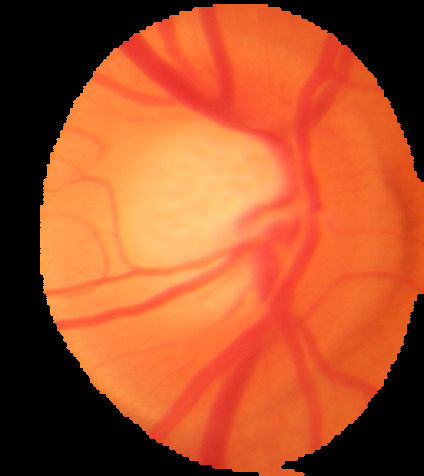

In [ ]:
# Import necessary libraries
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Load the input image
img = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Project Implementation/HRF_Data cleaning/HRF_Cropped/normal/09_h_result.jpg')

# Load the mask image
mask = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Project Implementation/HRF_Data cleaning/HRF_after_segmentation/normal/09_h_result_mask.png')

# Check if the images were loaded successfully
if img is None:
    print("Error loading image")
    exit()
if mask is None:
    print("Error loading mask image")
    exit()

# Convert the mask image to grayscale
mask_gray = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY)

# Resize the mask image to match the size of the input image
mask_resized = cv2.resize(mask_gray, (img.shape[1], img.shape[0]))

# Convert the mask image to the appropriate data type
mask_resized = mask_resized.astype(np.uint8)

# Apply the bitwise AND operation using the mask image and the input image
result = cv2.bitwise_and(img, img, mask=mask_resized)

# Display the result
cv2_imshow(result)

# Wait for a key press to exit
cv2.waitKey(0)

# Close all open windows
cv2.destroyAllWindows()


To crop the black area from the result image, you can follow these steps:

Find the bounding box coordinates of the non-black pixels in the result image. Crop the result image based on the bounding box coordinates. Here's the modified code to accomplish this:

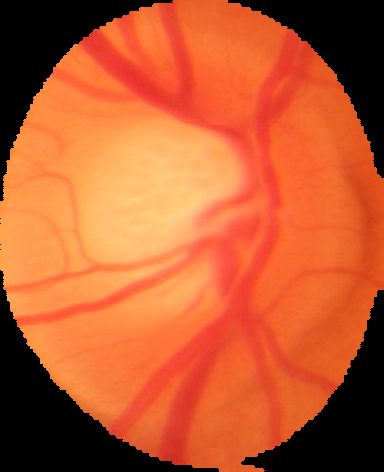

In [ ]:
# Import necessary libraries
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# Load the input image
img = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Project Implementation/HRF_Data cleaning/HRF_Cropped/normal/09_h_result.jpg')

# Load the mask image
mask = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Project Implementation/HRF_Data cleaning/HRF_after_segmentation/normal/09_h_result_mask.png')

# Check if the images were loaded successfully
if img is None:
    print("Error loading image")
    exit()
if mask is None:
    print("Error loading mask image")
    exit()

# Convert the mask image to grayscale
mask_gray = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY)

# Resize the mask image to match the size of the input image
mask_resized = cv2.resize(mask_gray, (img.shape[1], img.shape[0]))

# Convert the mask image to the appropriate data type
mask_resized = mask_resized.astype(np.uint8)

# Apply the bitwise AND operation using the mask image and the input image
result = cv2.bitwise_and(img, img, mask=mask_resized)

# Find contours in the resulting image
contours, _ = cv2.findContours(mask_resized, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Find the bounding box of the largest contour
largest_contour = max(contours, key=cv2.contourArea)
x, y, w, h = cv2.boundingRect(largest_contour)

# Crop the black area from the resulting image
cropped_result = result[y:y+h, x:x+w]

# Display the cropped result
cv2_imshow(cropped_result)

# Wait for a key press to exit
cv2.waitKey(0)

# Close all open windows
cv2.destroyAllWindows()


In [ ]:
# Import necessary libraries
import cv2
import numpy as np
import os

# Define the paths of the images and masks
image_dir = '/content/drive/MyDrive/Colab Notebooks/Project Implementation/HRF_Data cleaning/HRF_Cropped/glaucoma/'
mask_dir = '/content/drive/MyDrive/Colab Notebooks/Project Implementation/HRF_Data cleaning/HRF_after_segmentation/glaucoma/'
output_dir = '/content/drive/MyDrive/Colab Notebooks/Project Implementation/HRF_Data cleaning/HRF_after_segmentation_and_ROI/glaucoma/'

# Get the list of image and mask paths and sort them
image_paths = sorted([os.path.join(image_dir, file) for file in os.listdir(image_dir) if file.endswith('.jpg')])
mask_paths = sorted([os.path.join(mask_dir, file) for file in os.listdir(mask_dir) if file.endswith('.png')])

# Iterate over the sorted image and mask paths
for image_path, mask_path in zip(image_paths, mask_paths):
    # Load the image and mask
    img = cv2.imread(image_path)
    mask = cv2.imread(mask_path)

    # Check if the images were loaded successfully
    if img is None:
        print("Error loading image:", image_path)
        continue
    if mask is None:
        print("Error loading mask image:", mask_path)
        continue

    # Convert the mask image to grayscale
    mask_gray = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY)

    # Resize the mask image to match the size of the input image
    mask_resized = cv2.resize(mask_gray, (img.shape[1], img.shape[0]))

    # Convert the mask image to the appropriate data type
    mask_resized = mask_resized.astype(np.uint8)

    # Apply the bitwise AND operation using the mask image and the input image
    result = cv2.bitwise_and(img, img, mask=mask_resized)

    # Find contours in the resulting image
    contours, _ = cv2.findContours(mask_resized, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Find the bounding box of the largest contour
    largest_contour = max(contours, key=cv2.contourArea)
    x, y, w, h = cv2.boundingRect(largest_contour)

    # Crop the black area from the resulting image
    cropped_result = result[y:y+h, x:x+w]

    # Create the output directory if it doesn't exist
    os.makedirs(output_dir, exist_ok=True)

    # Save the cropped result to a new path
    output_path = os.path.join(output_dir, os.path.basename(image_path))
    cv2.imwrite(output_path, cropped_result)

    print("Saved cropped image:", output_path)


Saved cropped image: /content/drive/MyDrive/Colab Notebooks/Project Implementation/HRF_Data cleaning/HRF_after_segmentation_and_ROI/glaucoma/01_g_result.jpg
Saved cropped image: /content/drive/MyDrive/Colab Notebooks/Project Implementation/HRF_Data cleaning/HRF_after_segmentation_and_ROI/glaucoma/02_g_result.jpg
Saved cropped image: /content/drive/MyDrive/Colab Notebooks/Project Implementation/HRF_Data cleaning/HRF_after_segmentation_and_ROI/glaucoma/03_g_result.jpg
Saved cropped image: /content/drive/MyDrive/Colab Notebooks/Project Implementation/HRF_Data cleaning/HRF_after_segmentation_and_ROI/glaucoma/04_g_result.jpg
Saved cropped image: /content/drive/MyDrive/Colab Notebooks/Project Implementation/HRF_Data cleaning/HRF_after_segmentation_and_ROI/glaucoma/05_g_result.jpg
Saved cropped image: /content/drive/MyDrive/Colab Notebooks/Project Implementation/HRF_Data cleaning/HRF_after_segmentation_and_ROI/glaucoma/06_g_result.jpg
Saved cropped image: /content/drive/MyDrive/Colab Notebook

In [ ]:
# Import necessary libraries
import cv2
import numpy as np
import os

# Define the paths of the images and masks
image_dir = '/content/drive/MyDrive/Colab Notebooks/Project Implementation/HRF_Data cleaning/HRF_Cropped/normal/'
mask_dir = '/content/drive/MyDrive/Colab Notebooks/Project Implementation/HRF_Data cleaning/HRF_after_segmentation/normal/'
output_dir = '/content/drive/MyDrive/Colab Notebooks/Project Implementation/HRF_Data cleaning/HRF_after_segmentation_and_ROI/normal/'

# Get the list of image and mask paths and sort them
image_paths = sorted([os.path.join(image_dir, file) for file in os.listdir(image_dir) if file.endswith('.jpg')])
mask_paths = sorted([os.path.join(mask_dir, file) for file in os.listdir(mask_dir) if file.endswith('.png')])

# Iterate over the sorted image and mask paths
for image_path, mask_path in zip(image_paths, mask_paths):
    # Load the image and mask
    img = cv2.imread(image_path)
    mask = cv2.imread(mask_path)

    # Check if the images were loaded successfully
    if img is None:
        print("Error loading image:", image_path)
        continue
    if mask is None:
        print("Error loading mask image:", mask_path)
        continue

    # Convert the mask image to grayscale
    mask_gray = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY)

    # Resize the mask image to match the size of the input image
    mask_resized = cv2.resize(mask_gray, (img.shape[1], img.shape[0]))

    # Convert the mask image to the appropriate data type
    mask_resized = mask_resized.astype(np.uint8)

    # Apply the bitwise AND operation using the mask image and the input image
    result = cv2.bitwise_and(img, img, mask=mask_resized)

    # Find contours in the resulting image
    contours, _ = cv2.findContours(mask_resized, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Find the bounding box of the largest contour
    largest_contour = max(contours, key=cv2.contourArea)
    x, y, w, h = cv2.boundingRect(largest_contour)

    # Crop the black area from the resulting image
    cropped_result = result[y:y+h, x:x+w]

    # Create the output directory if it doesn't exist
    os.makedirs(output_dir, exist_ok=True)

    # Save the cropped result to a new path
    output_path = os.path.join(output_dir, os.path.basename(image_path))
    cv2.imwrite(output_path, cropped_result)

    print("Saved cropped image:", output_path)


Saved cropped image: /content/drive/MyDrive/Colab Notebooks/Project Implementation/HRF_Data cleaning/HRF_after_segmentation_and_ROI/normal/01_h_result.jpg
Saved cropped image: /content/drive/MyDrive/Colab Notebooks/Project Implementation/HRF_Data cleaning/HRF_after_segmentation_and_ROI/normal/02_h_result.jpg
Saved cropped image: /content/drive/MyDrive/Colab Notebooks/Project Implementation/HRF_Data cleaning/HRF_after_segmentation_and_ROI/normal/03_h_result.jpg
Saved cropped image: /content/drive/MyDrive/Colab Notebooks/Project Implementation/HRF_Data cleaning/HRF_after_segmentation_and_ROI/normal/04_h_result.jpg
Saved cropped image: /content/drive/MyDrive/Colab Notebooks/Project Implementation/HRF_Data cleaning/HRF_after_segmentation_and_ROI/normal/05_h_result.jpg
Saved cropped image: /content/drive/MyDrive/Colab Notebooks/Project Implementation/HRF_Data cleaning/HRF_after_segmentation_and_ROI/normal/06_h_result.jpg
Saved cropped image: /content/drive/MyDrive/Colab Notebooks/Project Im

In [ ]:
# Install necessary package
!pip install tensorflow==2.12.0

In [ ]:
import keras
import tensorflow as tf
print(keras.__version__)
print(tf.__version__)

2.12.0
2.12.0


In [ ]:
#Import libraries
import numpy as np
import pandas as pd
import os
from os import listdir
import cv2
import matplotlib.pyplot as plt
import imutils
from PIL import Image
from sklearn.model_selection import train_test_split
import tensorflow as tf
import keras
from keras.models import Sequential
from keras.preprocessing.image import ImageDataGenerator
from keras.applications.efficientnet import EfficientNetB0
from keras import layers

#from keras.utils.vis_utils import plot_model
from tensorflow.keras.utils import plot_model

from sklearn.metrics import accuracy_score, precision_score, recall_score
from sklearn.metrics import f1_score, cohen_kappa_score, roc_auc_score, confusion_matrix
from sklearn.metrics import classification_report, roc_curve
import seaborn as sns

In [ ]:
!pip install imutils

In [ ]:
os.listdir('/content/drive/MyDrive/Colab Notebooks/Project Implementation/ORIGA_Data cleaning/Augmented_Train_ORIGA')

['glaucoma', 'normal']

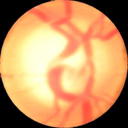

In [ ]:
#showing image of normal
im = Image.open('/content/drive/MyDrive/Colab Notebooks/Project Implementation/ORIGA_Data cleaning/Augmented_Train_ORIGA/normal/001_0_4582.jpg').resize((128, 128))
im

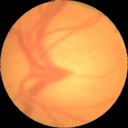

In [ ]:
#showing image of glaucoma
im = Image.open('/content/drive/MyDrive/Colab Notebooks/Project Implementation/ORIGA_Data cleaning/Augmented_Train_ORIGA/glaucoma/041_0_1990.jpg').resize((128, 128))
im

In [ ]:
#setting the directory of our data
glaucoma = os.listdir('/content/drive/MyDrive/Colab Notebooks/Project Implementation/ORIGA_Data cleaning/Augmented_Train_ORIGA/glaucoma')
normal = os.listdir('/content/drive/MyDrive/Colab Notebooks/Project Implementation/ORIGA_Data cleaning/Augmented_Train_ORIGA/normal')

#concate two data
data = np.concatenate([glaucoma,normal])
assert (len(data) == len(glaucoma)+len(normal))

#mapping our classes to 1 and 0. 1 == glaucoma and 0 == normal
target_x = np.full(len(glaucoma),1)
target_y = np.full(len(normal),0)

#label of our data
data_target = np.concatenate([target_x,target_y])

assert (len(data_target) == len(target_x)+len(target_y))
assert (len(data_target) == len(data))

print(len(target_x), len(target_y))

1008 1008


In [ ]:
#Data Prepocessing
#Setting the height and width of the image for our model
IMG_HEIGHT = 224
IMG_WIDTH = 224
IMAGE_SIZE = [IMG_HEIGHT, IMG_WIDTH]

In [ ]:

X_data = []

# Reading images from the glaucoma directory, resizing, preprocessing, and appending to the list
for file in glaucoma:
    img = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Project Implementation/ORIGA_Data cleaning/Augmented_Train_ORIGA/glaucoma/' + file)
    img2 = cv2.resize(img, (IMG_HEIGHT, IMG_WIDTH))
    preprocessed_img = img2 # I change
    X_data.append(preprocessed_img)

# Reading images from the normal directory, resizing, preprocessing, and appending to the list
for file in normal:
    img = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Project Implementation/ORIGA_Data cleaning/Augmented_Train_ORIGA/normal/' + file)
    img2 = cv2.resize(img, (IMG_HEIGHT, IMG_WIDTH))
    preprocessed_img = img2 # I change
    X_data.append(preprocessed_img)

X_data = np.squeeze(X_data)
assert (len(X_data) == len(data) == len(data_target))


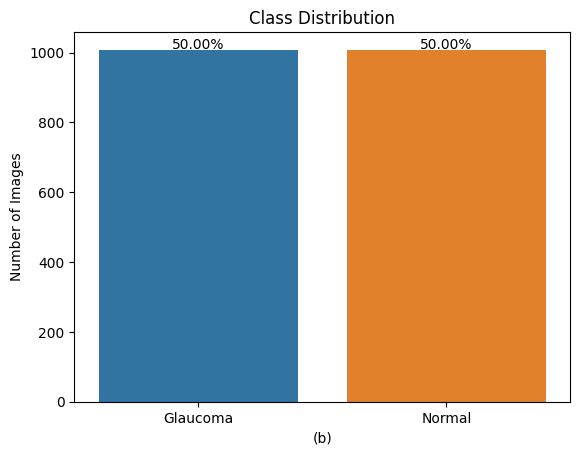

In [ ]:
import seaborn as sns

labels = []
for x in data_target:
  if x == 0:
    labels.append('Normal')
  else:
    labels.append('Glaucoma')

total = len(labels)

#sns.set(style="darkgrid")
ax = sns.countplot(x=labels)

for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2f}%'.format(height*100/total),
            ha="center")

plt.title('Class Distribution')
plt.ylabel('Number of Images')
plt.xlabel('(b)')
plt.show()

In [ ]:
# normalize data
X = X_data.astype('float32')
X /= 255

In [ ]:
X_data.shape

(2016, 224, 224, 3)

In [ ]:
# split the data
X_train, X_test, y_train, y_test = train_test_split(X, data_target, random_state=50, test_size=0.001, stratify = data_target) #I  cahnge from 0.15 to 0.001

print(len(y_train))
print(len(y_test))

2013
3


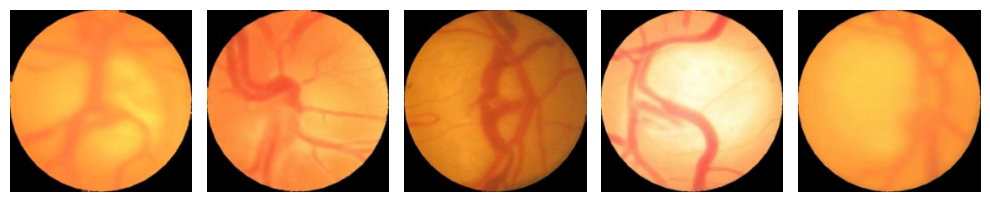

In [ ]:
#I add
#sample of training data
import matplotlib.pyplot as plt
num_samples = 5
fig, axs = plt.subplots(1, num_samples, figsize=(10, 4))

for i in range(num_samples):
    axs[i].imshow(cv2.cvtColor(X_train[i], cv2.COLOR_BGR2RGB))  # Assuming grayscale images
    axs[i].set_title(''.format(i))
    axs[i].axis('off')

plt.tight_layout()
plt.show()


# **EfficientNetB0**

In [ ]:
!pip install efficientnet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 1.3 MB/s eta 0:00:00


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping, TensorBoard
from efficientnet.tfkeras import EfficientNetB0

def GetEfficientNetB0Model(INPUT_SHAPE=(224, 224, 3), bTrainConvolutionBase=False):
    conv_base = EfficientNetB0(weights="imagenet", include_top=False, input_shape=INPUT_SHAPE)

    if not bTrainConvolutionBase:
        conv_base.trainable = False

    model = Sequential(name='Glaucoma_detection_With_EfficientNet_B0')
    model.add(conv_base)
    model.add(GlobalAveragePooling2D())
    model.add(Dropout(0.3))
    model.add(Dense(1, activation="sigmoid"))

    model.compile(optimizer=Adam(learning_rate=0.0001),
                  loss='binary_crossentropy',
                  metrics=['accuracy'])

    print(model.summary())
    return model


In [ ]:
model = GetEfficientNetB0Model(bTrainConvolutionBase=True)

Model: "Glaucoma_detection_With_EfficientNet_B0"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnet-b0 (Functional  (None, 7, 7, 1280)       4049564   
 )                                                               
                                                                 
 global_average_pooling2d (G  (None, 1280)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dropout (Dropout)           (None, 1280)              0         
                                                                 
 dense (Dense)               (None, 1)                 1281      
                                                                 
Total params: 4,050,845
Trainable params: 4,008,829
Non-trainable params: 42,016
_________________________________________________________________
None


In [ ]:

# Define the checkpoint filepath
checkpoint_filepath = "/content/drive/MyDrive/Colab Notebooks/Project Implementation/Classification/checkpoint_ORIGA/After_use_all_augmented_for_Train/Classification_EfficientNetB0_Aug_Train_ORIGA_epoch_15_batch_32_patience_6_lr=0.001_weights.best.hdf5"

# Create a ModelCheckpoint callback to save the best weights
checkpoint = ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True
)

# Create an EarlyStopping callback to stop training when the validation loss stops improving
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=6,
    restore_best_weights=True
)

In [ ]:
#EfficientNetB0   //// The best
#patience=5 #lr=0.0001
#batch_size=32, #epochs=15, # Train the model
history = model.fit(
    X_train, y_train,
    batch_size=32,
    epochs=15,
    validation_split=0.18,
    callbacks=[checkpoint,
               early_stopping
               ]
)


Epoch 1/15
52/52 [==============================] - 82s 318ms/step - loss: 0.4204 - accuracy: 0.8061 - val_loss: 0.6234 - val_accuracy: 0.5840
Epoch 2/15
52/52 [==============================] - 15s 284ms/step - loss: 0.1839 - accuracy: 0.9388 - val_loss: 0.6378 - val_accuracy: 0.6171
Epoch 3/15
52/52 [==============================] - 13s 252ms/step - loss: 0.0849 - accuracy: 0.9733 - val_loss: 0.8915 - val_accuracy: 0.5702
Epoch 4/15
52/52 [==============================] - 14s 270ms/step - loss: 0.0521 - accuracy: 0.9855 - val_loss: 0.6783 - val_accuracy: 0.6639
Epoch 5/15
52/52 [==============================] - 15s 297ms/step - loss: 0.0366 - accuracy: 0.9885 - val_loss: 0.3849 - val_accuracy: 0.8154
Epoch 6/15
52/52 [==============================] - 13s 252ms/step - loss: 0.0213 - accuracy: 0.9952 - val_loss: 0.4514 - val_accuracy: 0.8154
Epoch 7/15
52/52 [==============================] - 15s 287ms/step - loss: 0.0187 - accuracy: 0.9945 - val_loss: 0.3533 - val_accuracy: 0.8512

In [ ]:
# Save the model
model.save('/content/drive/MyDrive/Colab Notebooks/Project Implementation/Classification/Saved_model_ORIGA/After_use_all_augmented_for_Train/Classification_EfficientNetB0_Aug_Train_ORIGA_epoch_15_batch_32_lr=0.0001_model.h5')

# **Model Evaluation**

In [ ]:
history = model.history.history

train_loss = history['loss']
val_loss = history['val_loss']
train_acc = history['accuracy']
val_acc = history['val_accuracy']


# Loss
plt.figure()
plt.plot(train_loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.xlabel('Number of Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.savefig('/content/drive/MyDrive/Colab Notebooks/Project Implementation/Classification/graphes_Aug_ORIGA/After_use_all_augmented_for_Train/Classification_EfficientNetB0_Aug_Train_ORIGA_epoch_15_batch_32_lr=0.0001_loss_graph.png')#add
plt.show()

# Accuracy#
plt.figure()
plt.plot(train_acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.xlabel('Number of Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.savefig('/content/drive/MyDrive/Colab Notebooks/Project Implementation/Classification/graphes_Aug_ORIGA/After_use_all_augmented_for_Train/Classification_EfficientNetB0_Aug_Train_ORIGA_epoch_15_batch_32_lr=0.0001_accuracy_graph.png')
plt.show()

In [ ]:
import pickle

# Save the history
with open('/content/drive/MyDrive/Colab Notebooks/Project Implementation/Classification/saved_history_ORIGA/After_use_all_augmented_for_Train/Classification_EfficientNetB0_Aug_Train_ORIGA_epoch_15_batch_32_lr=0.0001_history.pickle', 'wb') as file:
    pickle.dump(history, file)

# **To test the trained model on a test set**


In [ ]:
!pip install efficientnet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 2.6 MB/s eta 0:00:00


In [ ]:
#Import libraries
import os
import cv2
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, classification_report
from tensorflow.keras.models import load_model
from tensorflow.keras.layers import Dropout

import efficientnet.tfkeras

# Define the path to the new test dataset folder
test_data_dir = '/content/drive/MyDrive/Colab Notebooks/Project Implementation/ORIGA_Data cleaning/ORIGA_Split/Test ORIGA(Epoch_15_batch_32_lr=0.0001)'


# Load the trained model

###The bes
model = load_model('/content/drive/MyDrive/Colab Notebooks/Project Implementation/Classification/Saved_model_ORIGA/After_use_all_augmented_for_Train/Classification_EfficientNetB0_Aug_Train_ORIGA_epoch_15_batch_32_lr=0.0001_model.h5')


# Preprocess the new test dataset
IMG_HEIGHT = 224
IMG_WIDTH = 224

X_test_new = []
y_test_new = []

for class_name in os.listdir(test_data_dir):
    class_dir = os.path.join(test_data_dir, class_name)
    if os.path.isdir(class_dir):
        for image_file in os.listdir(class_dir):
            image_path = os.path.join(class_dir, image_file)
            image = cv2.imread(image_path)
            image = cv2.resize(image, (IMG_HEIGHT, IMG_WIDTH))
            image = image / 255.0  # Normalize pixel values to [0, 1]
            X_test_new.append(image)
            if class_name == 'glaucoma':
                y_test_new.append(1)
            else:
                y_test_new.append(0)

X_test_new = np.array(X_test_new)
y_test_new = np.array(y_test_new)


In [ ]:
from keras.models import load_model
# load model

#The best
model = load_model('/content/drive/MyDrive/Colab Notebooks/Project Implementation/Classification/Saved_model_ORIGA/After_use_all_augmented_for_Train/Classification_EfficientNetB0_Aug_Train_ORIGA_epoch_15_batch_32_lr=0.0001_model.h5')

_, acc = model.evaluate(X_test_new, y_test_new)#I change here
print("Accuracy = ", (acc * 100.0), "%")

2/2 [==============================] - 6s 3s/step


<Axes: >

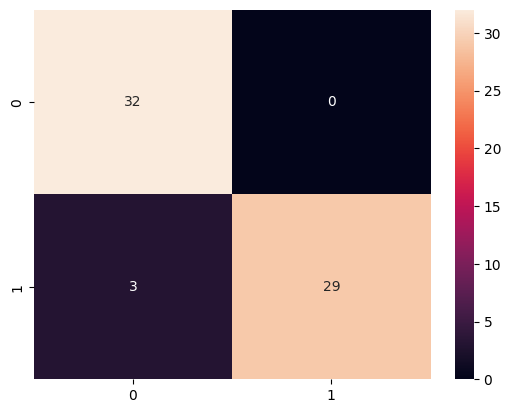

In [ ]:

#How do we know how it is doing for glaucoma vs normal?
################################################################

#Confusion matrix
#We compare labels and plot them based on correct or wrong predictions.
#Since sigmoid outputs probabilities we need to apply threshold to convert to label.

mythreshold =0.300251
from sklearn.metrics import confusion_matrix
import seaborn as sns

y_pred_new = (model.predict(X_test_new)>= mythreshold).astype(int)#I change here
cm=confusion_matrix(y_test_new, y_pred_new)#I change here
sns.heatmap(cm, annot=True)

#Check the confusion matrix for various thresholds. Which one is good?
#Need to balance positive, negative, false positive and false negative.

In [ ]:
#ROC can help identify the right threshold.
#Refer to video 106 for explanation of ROC curves.
##################################################################
"""
Receiver Operating Characteristic (ROC) Curve is a plot that helps us
visualize the performance of a binary classifier when the threshold is varied.
"""
#ROC
import matplotlib.pyplot as plt # I add this
from sklearn.metrics import roc_curve
y_preds = model.predict(X_test_new).ravel()#I change here to X_test_new

fpr, tpr, thresholds = roc_curve(y_test_new, y_preds)#I change here
plt.figure(1)
plt.plot([0, 1], [0, 1], 'y--')
plt.plot(fpr, tpr, marker='.')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.show()

In [ ]:

"""
#One way to find the best threshold once we calculate the true positive
and false positive rates is ...
The optimal cut off point would be where “true positive rate” is high
and the “false positive rate” is low.
Based on this logic let us find the threshold where tpr-(1-fpr) is zero (or close to 0)
"""
import pandas as pd
i = np.arange(len(tpr))
roc = pd.DataFrame({'tf' : pd.Series(tpr-(1-fpr), index=i), 'thresholds' : pd.Series(thresholds, index=i)})
ideal_roc_thresh = roc.iloc[(roc.tf-0).abs().argsort()[:1]]  #Locate the point where the value is close to 0
print("Ideal threshold is: ", ideal_roc_thresh['thresholds'])


Ideal threshold is:  2    0.174678
Name: thresholds, dtype: float32


In [ ]:

#Now use this threshold value in the confusion matrix to visualize the balance
#between tp, fp, fp, and fn


#AUC
#Area under the curve (AUC) for ROC plot can be used to understand hpw well a classifier
#is performing.
#% chance that the model can distinguish between positive and negative classes.

from sklearn.metrics import auc
auc_value = auc(fpr, tpr)
print("Area under curve, AUC = ", auc_value)

2/2 [==============================] - 4s 2s/step


<Axes: >

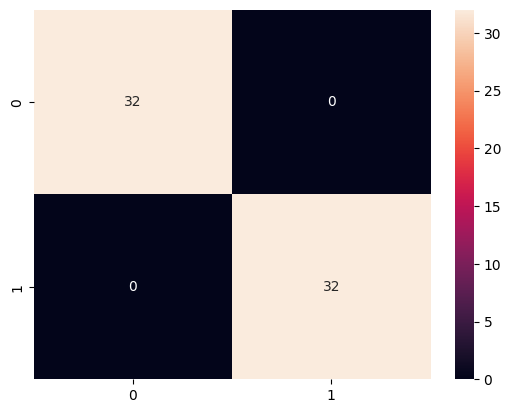

In [ ]:

#How do we know how it is doing for glaucoma vs normal?
################################################################

#Confusion matrix
#We compare labels and plot them based on correct or wrong predictions.
#Since sigmoid outputs probabilities we need to apply threshold to convert to label.

mythreshold=             0.174678
from sklearn.metrics import confusion_matrix
import seaborn as sns

y_pred_new = (model.predict(X_test_new)>= mythreshold).astype(int)#I change here
cm=confusion_matrix(y_test_new, y_pred_new)#I change here
sns.heatmap(cm, annot=True)

#Check the confusion matrix for various thresholds. Which one is good?
#Need to balance positive, negative, false positive and false negative.

In [ ]:
# Make predictions on the new test data
y_pred_new = model.predict(X_test_new)
y_pred_new = [1 if x >=   0.174678 else 0 for x in y_pred_new]


2/2 [==============================] - 6s 3s/step


In [ ]:
#for epoch 15 batch 32 // Test ORIGA(Epoch_15_batch_32_lr=0.0001)  //threshold  0.174685 *  /best
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, confusion_matrix

# Calculate performance metrics
accuracy = accuracy_score(y_test_new, y_pred_new)
precision = precision_score(y_test_new, y_pred_new)
recall = recall_score(y_test_new, y_pred_new)
f1_score = f1_score(y_test_new, y_pred_new)
auc = roc_auc_score(y_test_new, y_pred_new)
confusion_matrix = confusion_matrix(y_test_new, y_pred_new)

# Calculate specificity
specificity = confusion_matrix[0, 0] / (confusion_matrix[0, 0] + confusion_matrix[0, 1])

# Print the performance metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1_score)
print("AUC:", auc)
print("Specificity:", specificity)
print("Confusion Matrix:\n", confusion_matrix)

# Generate classification report
target_names = ['normal', 'glaucoma']
classification_rep = classification_report(y_test_new, y_pred_new, target_names=target_names)

# Print the classification report
print(classification_rep)

Accuracy: 1.0
Precision: 1.0
Recall: 1.0
F1-score: 1.0
AUC: 1.0
Specificity: 1.0
Confusion Matrix:
 [[32  0]
 [ 0 32]]
              precision    recall  f1-score   support

      normal       1.00      1.00      1.00        32
    glaucoma       1.00      1.00      1.00        32

    accuracy                           1.00        64
   macro avg       1.00      1.00      1.00        64
weighted avg       1.00      1.00      1.00        64



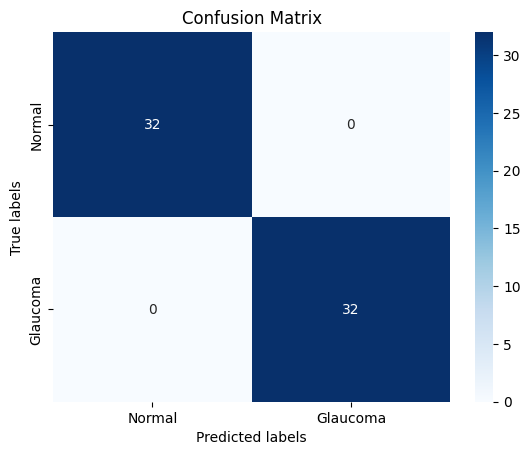

In [ ]:
#for epoch 15 batch 32 // Test ORIGA(Epoch_15_batch_32_lr=0.0001)  //threshold  0.174685 *  /best
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate the confusion matrix
confusion_mat = confusion_matrix(y_test_new, y_pred_new)

# Plot the confusion matrix
labels = ["Normal", "Glaucoma"]
sns.heatmap(confusion_mat, annot=True, cmap="Blues", fmt="d", xticklabels=labels, yticklabels=labels)
plt.xlabel("Predicted labels")
plt.ylabel("True labels")
plt.title("Confusion Matrix")

# Save the figure
plt.savefig("/content/drive/MyDrive/Colab Notebooks/Project Implementation/Classification/good_graph_Aug_ORIGA/After_use_all_augmented_for_Train/Classification_EfficientNetB0_Aug_Train_ORIGA_epoch_15_batch_32_lr=0.0001_confusion_matrix.png")

# Show the figure
plt.show()


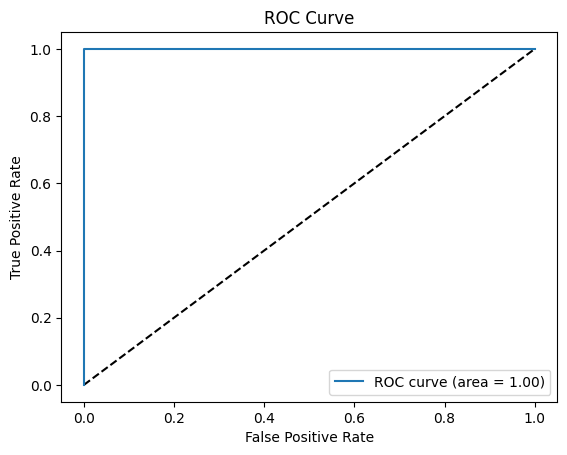

In [ ]:
#for epoch 15 batch 32 // Test ORIGA(Epoch_15_batch_32_lr=0.0001)  //threshold  0.174685 *  //////best

#ROC Curve
fpr, tpr, thresholds = roc_curve(y_test_new, y_pred_new)
plt.plot([0, 1], [0, 1], 'k--')
#plt.plot(fpr, tpr, label='EfficientNetB0')
plt.plot(fpr, tpr, label="ROC curve (area = %0.2f)" % auc)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.savefig('/content/drive/MyDrive/Colab Notebooks/Project Implementation/Classification/good_graph_Aug_ORIGA/After_use_all_augmented_for_Train/Classification_EfficientNetB0_Aug_Train_ORIGA_epoch_15_batch_32_lr=0.0001_ROC Curve_graph.png')
plt.show();

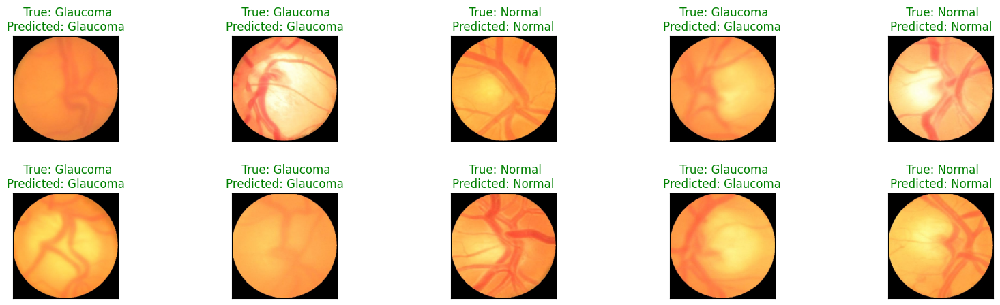

In [ ]:
#for epoch 15 batch 32 // Test ORIGA(Epoch_15_batch_32_lr=0.0001)  //threshold  0.174685 *  //////best
import cv2
import matplotlib.pyplot as plt
import numpy as np

labels = ["Normal", "Glaucoma"]

figure = plt.figure(figsize=(20, 8))

for i, index in enumerate(np.random.choice(X_test_new.shape[0], size=10, replace=False)):
    ax = figure.add_subplot(3, 5, i + 1, xticks=[], yticks=[])
    # Read the image in BGR format
    bgr_image = np.squeeze(X_test_new[index])
    # Convert the image to 8-bit (values between 0 and 255)
    bgr_image_8bit = cv2.normalize(bgr_image, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)
    # Convert the 8-bit BGR image to RGB
    rgb_image = cv2.cvtColor(bgr_image_8bit, cv2.COLOR_BGR2RGB)
    # Display the RGB image
    ax.imshow(rgb_image)
    predict_index = y_pred_new[index]
    true_index = y_test_new[index]
    # Set the title for each image
    true_label = labels[true_index]
    predict_label = labels[predict_index]
    title = " True: {}\nPredicted: {}".format(true_label, predict_label)
    ax.set_title(title, color=("green" if predict_index == true_index else "red"))

# Adjust the spacing between the subplots
figure.subplots_adjust(hspace=0.5)

# Save the figure
plt.savefig('/content/drive/MyDrive/Colab Notebooks/Project Implementation/Classification/good_graph_Aug_ORIGA/After_use_all_augmented_for_Train/Classification_EfficientNetB0_Aug_Train_ORIGA_epoch_15_batch_32_lr=0.0001_test_sample_images.png')

In [ ]:
#To test model on test set

import cv2
import numpy as np
from tensorflow.keras.models import load_model
from matplotlib import pyplot as plt

#I add this
import efficientnet.tfkeras

# Load the segmentation model
segmentation_model = load_model('/content/drive/MyDrive/Colab Notebooks/Project Implementation/New_Experiments/Saved_model/Segmentation_UNET_Resnet34_ORIGA&RIMONEDL_with_Aug_V2_2040_without_denoising_Epoch_50_batch_16.hdf5', compile=False)

# Load the classification model
classification_model = load_model('/content/drive/MyDrive/Colab Notebooks/Project Implementation/Classification/Saved_model_ORIGA/After_use_all_augmented_for_Train/Classification_EfficientNetB0_Aug_Train_ORIGA_epoch_15_batch_32_lr=0.0001_model.h5')
# Define the preprocessing function for the segmentation model
def preprocess_segmentation_image(image):
    # Apply resize
    new_width = 128
    new_height = 128
    dim = (new_width, new_height)
    resized_image = cv2.resize(image, dim, interpolation=cv2.INTER_AREA)
    # Preprocess the image
    preprocessed_image = resized_image / 255.
    return preprocessed_image

# Define the preprocessing function for the classification model
def preprocess_classification_image(image):
    # Resize the image
    img = cv2.resize(image, (224, 224))
    # Normalize the image
    img = img.astype('float32') / 255
    # Reshape the image to match the model's input shape
    img = np.expand_dims(img, axis=0)
    return img

# Load the image
image = cv2.imread('/test_ORIGA.jpg')

# Preprocess the image for segmentation
preprocessed_image = preprocess_segmentation_image(image)

# Make segmentation prediction
segmentation_prediction = segmentation_model.predict(np.expand_dims(preprocessed_image, axis=0))
segmentation_mask = np.argmax(segmentation_prediction, axis=3)[0]

# Resize the mask to match the image size
segmentation_mask_resized = cv2.resize(segmentation_mask.astype(np.uint8), (image.shape[1], image.shape[0]))


# Apply the mask to the original image
segmented_image = cv2.bitwise_and(image, image, mask=segmentation_mask_resized)

# Convert the segmented image to grayscale
gray = cv2.cvtColor(segmented_image, cv2.COLOR_BGR2GRAY)

# Find contours in the grayscale image
contours, _ = cv2.findContours(gray, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Find the bounding rectangle for each contour
bounding_rectangles = [cv2.boundingRect(contour) for contour in contours]

# Get the x, y, w, h of the bounding rectangle with the maximum area
x, y, w, h = max(bounding_rectangles, key=lambda rect: rect[2] * rect[3])

# Crop the black area from the segmented image
cropped_segmented_image = segmented_image[y:y+h, x:x+w]

# Preprocess the cropped segmented image for classification
preprocessed_segmented_image = preprocess_classification_image(cropped_segmented_image)

# Make classification prediction
classification_prediction = classification_model.predict(preprocessed_segmented_image)
label = "Glaucoma" if classification_prediction[0][0] >= 0.174685 else "Normal" # rather than 0.5

# Display the images and prediction using matplotlib
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
axs[0].set_title('Input')
axs[0].axis('off')
axs[1].imshow(cv2.cvtColor(cropped_segmented_image, cv2.COLOR_BGR2RGB))
axs[1].set_title('ROI')
axs[1].axis('off')
plt.show()

print(f"The prediction for the image is: {label}")


In [ ]:
!pip install tensorflow==2.12.0

In [ ]:
import keras
import tensorflow as tf
print(keras.__version__)
print(tf.__version__)

2.12.0
2.12.0


In [ ]:
#Import libraries
import numpy as np
import pandas as pd
import os
from os import listdir
import cv2
import matplotlib.pyplot as plt
import imutils
from PIL import Image
from sklearn.model_selection import train_test_split
import tensorflow as tf
import keras
from keras.models import Sequential
from keras.preprocessing.image import ImageDataGenerator
from keras.applications.efficientnet import EfficientNetB0
from keras import layers

#from keras.utils.vis_utils import plot_model
from tensorflow.keras.utils import plot_model

from sklearn.metrics import accuracy_score, precision_score, recall_score
from sklearn.metrics import f1_score, cohen_kappa_score, roc_auc_score, confusion_matrix
from sklearn.metrics import classification_report, roc_curve
import seaborn as sns

In [ ]:
!pip install imutils

In [ ]:
os.listdir('/content/drive/MyDrive/Colab Notebooks/Project Implementation/RIM ONE DL_Data cleaning/Augmented_Train_RIM-ONE_DL')

['normal', 'glaucoma']

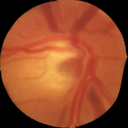

In [ ]:
#showing image of normal
im = Image.open('/content/drive/MyDrive/Colab Notebooks/Project Implementation/RIM ONE DL_Data cleaning/Augmented_Train_RIM-ONE_DL/normal/result_r1_Im001_0_5569.png').resize((128, 128))
im

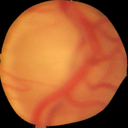

In [ ]:
#showing image of glaucoma
im = Image.open('/content/drive/MyDrive/Colab Notebooks/Project Implementation/RIM ONE DL_Data cleaning/Augmented_Train_RIM-ONE_DL/glaucoma/result_r1_Im113_0_1902.png').resize((128, 128))
im

In [ ]:
#setting the directory of our data
glaucoma = os.listdir('/content/drive/MyDrive/Colab Notebooks/Project Implementation/RIM ONE DL_Data cleaning/Augmented_Train_RIM-ONE_DL/glaucoma')
normal = os.listdir('/content/drive/MyDrive/Colab Notebooks/Project Implementation/RIM ONE DL_Data cleaning/Augmented_Train_RIM-ONE_DL/normal')

#concate two data
data = np.concatenate([glaucoma,normal])
assert (len(data) == len(glaucoma)+len(normal))

#mapping our classes to 1 and 0. 1 == glaucoma and 0 == normal
target_x = np.full(len(glaucoma),1)
target_y = np.full(len(normal),0)

#label of our data
data_target = np.concatenate([target_x,target_y])

assert (len(data_target) == len(target_x)+len(target_y))
assert (len(data_target) == len(data))

print(len(target_x), len(target_y))

960 960


In [ ]:
#Setting the height and width of the image for our model
IMG_HEIGHT = 224
IMG_WIDTH = 224
IMAGE_SIZE = [IMG_HEIGHT, IMG_WIDTH]

X_data = []

# Reading images from the glaucoma directory, resizing, preprocessing, and appending to the list
for file in glaucoma:
    img = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Project Implementation/RIM ONE DL_Data cleaning/Augmented_Train_RIM-ONE_DL/glaucoma/' + file)
    img2 = cv2.resize(img, (IMG_HEIGHT, IMG_WIDTH))
    preprocessed_img = img2 # I change
    X_data.append(preprocessed_img)

# Reading images from the normal directory, resizing, preprocessing, and appending to the list
for file in normal:
    img = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Project Implementation/RIM ONE DL_Data cleaning/Augmented_Train_RIM-ONE_DL/normal/' + file)
    img2 = cv2.resize(img, (IMG_HEIGHT, IMG_WIDTH))
    preprocessed_img = img2 # I change
    X_data.append(preprocessed_img)

X_data = np.squeeze(X_data)
assert (len(X_data) == len(data) == len(data_target))


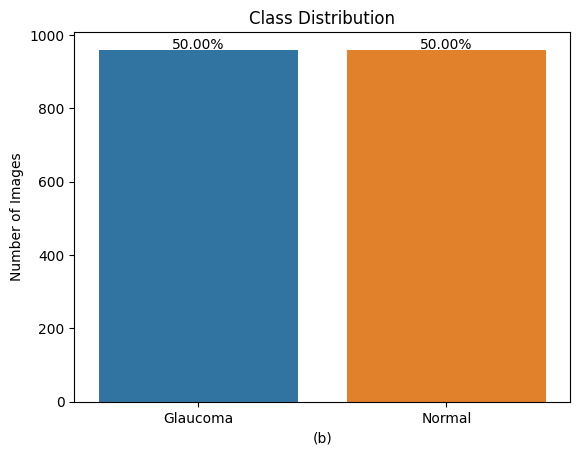

In [ ]:
import seaborn as sns

labels = []
for x in data_target:
  if x == 0:
    labels.append('Normal')
  else:
    labels.append('Glaucoma')

total = len(labels)

#sns.set(style="darkgrid")
ax = sns.countplot(x=labels)

for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x()+p.get_width()/2.,
            height + 3,
            '{:1.2f}%'.format(height*100/total),
            ha="center")

plt.title('Class Distribution')
plt.ylabel('Number of Images')
plt.xlabel('(b)')
plt.show()

In [ ]:
# normalize data
X = X_data.astype('float32')
X /= 255

In [ ]:
X_data.shape

(1920, 224, 224, 3)

In [ ]:
# split the data into 75:15:15 ratio
X_train, X_test, y_train, y_test = train_test_split(X, data_target, random_state=50, test_size=0.001, stratify = data_target) #change from 0.15 to 0.001

print(len(y_train))
print(len(y_test))

1918
2


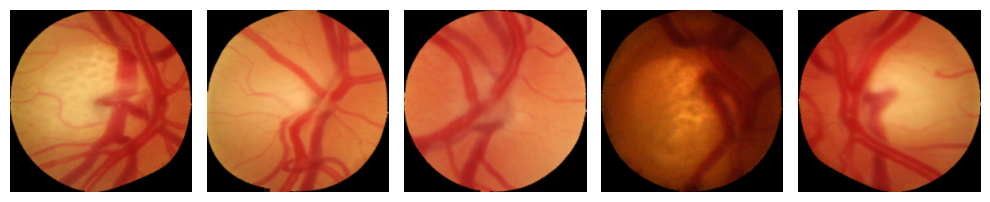

In [ ]:
#I add
#sample of training data
import matplotlib.pyplot as plt
num_samples = 5
fig, axs = plt.subplots(1, num_samples, figsize=(10, 4))

for i in range(num_samples):
    axs[i].imshow(cv2.cvtColor(X_train[i], cv2.COLOR_BGR2RGB))  # Assuming grayscale images
    axs[i].set_title(''.format(i))
    axs[i].axis('off')

plt.tight_layout()
plt.show()


# **EfficientNetB0**

In [ ]:
!pip install efficientnet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 1.3 MB/s eta 0:00:00


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping, TensorBoard
from efficientnet.tfkeras import EfficientNetB0

def GetEfficientNetB0Model(INPUT_SHAPE=(224, 224, 3), bTrainConvolutionBase=False):
    conv_base = EfficientNetB0(weights="imagenet", include_top=False, input_shape=INPUT_SHAPE)

    if not bTrainConvolutionBase:
        conv_base.trainable = False

    model = Sequential(name='Glaucoma_detection_With_EfficientNet_B0')
    model.add(conv_base)
    model.add(GlobalAveragePooling2D())
    model.add(Dropout(0.3))
    model.add(Dense(1, activation="sigmoid"))

    model.compile(optimizer=Adam(learning_rate=0.0001),
                  loss='binary_crossentropy',
                  metrics=['accuracy'])

    print(model.summary())
    return model


In [ ]:
model = GetEfficientNetB0Model(bTrainConvolutionBase=True)

Model: "Glaucoma_detection_With_EfficientNet_B0"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnet-b0 (Functional  (None, 7, 7, 1280)       4049564   
 )                                                               
                                                                 
 global_average_pooling2d (G  (None, 1280)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dropout (Dropout)           (None, 1280)              0         
                                                                 
 dense (Dense)               (None, 1)                 1281      
                                                                 
Total params: 4,050,845
Trainable params: 4,008,829
Non-trainable params: 42,016
_________________________________________________________________
None


In [ ]:

# Define the checkpoint filepath
checkpoint_filepath = "/content/drive/MyDrive/Colab Notebooks/Project Implementation/Classification/checkpoint_RIM-ONE DL/After_use_all_augmented_for_Train/Classification_EfficientNetB0_Aug_Train_RIM-ONE_DL_epoch_25_batch_8_lr=0.0001_version2_weights.best.hdf5"

# Create a ModelCheckpoint callback to save the best weights
checkpoint = ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True
)

# Create an EarlyStopping callback to stop training when the validation loss stops improving
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)

In [ ]:
#EfficientNetB0     // lr=0.0001  //good
#patience=5
#batch_size=8, #epochs=15, # Train the model
history = model.fit(
    X_train, y_train,
    batch_size=8,
    epochs=15,
    validation_split=0.18,
    callbacks=[checkpoint,
               early_stopping
               ]
)


Epoch 1/15
197/197 [==============================] - 56s 64ms/step - loss: 0.3163 - accuracy: 0.8556 - val_loss: 0.7554 - val_accuracy: 0.5202
Epoch 2/15
197/197 [==============================] - 10s 50ms/step - loss: 0.1169 - accuracy: 0.9612 - val_loss: 0.5766 - val_accuracy: 0.6561
Epoch 3/15
197/197 [==============================] - 10s 49ms/step - loss: 0.0687 - accuracy: 0.9784 - val_loss: 0.0480 - val_accuracy: 0.9942
Epoch 4/15
197/197 [==============================] - 10s 52ms/step - loss: 0.0455 - accuracy: 0.9892 - val_loss: 0.0034 - val_accuracy: 1.0000
Epoch 5/15
197/197 [==============================] - 9s 48ms/step - loss: 0.0281 - accuracy: 0.9917 - val_loss: 0.0049 - val_accuracy: 1.0000
Epoch 6/15
197/197 [==============================] - 9s 47ms/step - loss: 0.0243 - accuracy: 0.9943 - val_loss: 0.0053 - val_accuracy: 1.0000
Epoch 7/15
197/197 [==============================] - 9s 47ms/step - loss: 0.0207 - accuracy: 0.9955 - val_loss: 0.0046 - val_accuracy: 1.

In [ ]:
model.save('/content/drive/MyDrive/Colab Notebooks/Project Implementation/Classification/Saved_model_RIM-ONE_DL/After_use_all_augmented_for_Train/Classification_EfficientNetB0_Aug_Train_RIM-ONE_DL_epoch_15_batch_8_lr=0.0001_version2_model.h5')

In [ ]:
import pickle

# Save the history
with open('/content/drive/MyDrive/Colab Notebooks/Project Implementation/Classification/saved_history_RIM-ONE-DL/After_use_all_augmented_for_Train/Classification_EfficientNetB0_Aug_Train_RIM-ONE_DL_epoch_15_batch_8_lr=0.0001_version2_history.pickle', 'wb') as file:
    pickle.dump(history, file)

# **Model Evaluation**

In [ ]:
history = model.history.history

train_loss = history['loss']
val_loss = history['val_loss']
train_acc = history['accuracy']
val_acc = history['val_accuracy']



# Loss
plt.figure()
plt.plot(train_loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.xlabel('Number of Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.savefig('/content/drive/MyDrive/Colab Notebooks/Project Implementation/Classification/graphes_aug_RIM-ONE DL/After_use_all_augmented_for_Train/Classification_EfficientNetB0_Aug_Train_RIM-ONE_DL_epoch_15_batch_8_lr=0.0001_version2_loss_graph.png')#add
plt.show()

# Accuracy#
plt.figure()
plt.plot(train_acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.xlabel('Number of Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.savefig('/content/drive/MyDrive/Colab Notebooks/Project Implementation/Classification/graphes_aug_RIM-ONE DL/After_use_all_augmented_for_Train/Classification_EfficientNetB0_Aug_Train_RIM-ONE_DL_epoch_15_batch_8_lr=0.0001_version2_accuracy_graph.png')
plt.show()

# **To test the trained model on a test set**


In [ ]:
!pip install efficientnet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 2.6 MB/s eta 0:00:00


In [ ]:
import os
import cv2
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, classification_report
from tensorflow.keras.models import load_model
from tensorflow.keras.layers import Dropout

#I add this later
import efficientnet.tfkeras
from tensorflow.keras.models import load_model

# Define the path to the new test dataset folder
test_data_dir = '/content/drive/MyDrive/Colab Notebooks/Project Implementation/RIM ONE DL_Data cleaning/RIM-ONE_DL_Split/Test(RIM-ONE_DL epch 15 batch 8 version2)'
#test_data_dir = '/content/drive/MyDrive/Colab Notebooks/Project Implementation/HRF_Data cleaning/HRF_after_segmentation_and_ROI'

# Load the trained model



#version2 lr=0.0001
#batch 8

##The best
model = load_model('/content/drive/MyDrive/Colab Notebooks/Project Implementation/Classification/Saved_model_RIM-ONE_DL/After_use_all_augmented_for_Train/Classification_EfficientNetB0_Aug_Train_RIM-ONE_DL_epoch_15_batch_8_lr=0.0001_version2_model.h5')


# Preprocess the new test dataset
IMG_HEIGHT = 224
IMG_WIDTH = 224

X_test_new = []
y_test_new = []

for class_name in os.listdir(test_data_dir):
    class_dir = os.path.join(test_data_dir, class_name)
    if os.path.isdir(class_dir):
        for image_file in os.listdir(class_dir):
            image_path = os.path.join(class_dir, image_file)
            image = cv2.imread(image_path)
            image = cv2.resize(image, (IMG_HEIGHT, IMG_WIDTH))
            image = image / 255.0  # Normalize pixel values to [0, 1]
            X_test_new.append(image)
            if class_name == 'glaucoma':
                y_test_new.append(1)
            else:
                y_test_new.append(0)

X_test_new = np.array(X_test_new)
y_test_new = np.array(y_test_new)


In [ ]:
#
#I add this
import efficientnet.tfkeras
from tensorflow.keras.models import load_model
from keras.models import load_model
# load model

##The best
model = load_model('/content/drive/MyDrive/Colab Notebooks/Project Implementation/Classification/Saved_model_RIM-ONE_DL/After_use_all_augmented_for_Train/Classification_EfficientNetB0_Aug_Train_RIM-ONE_DL_epoch_15_batch_8_lr=0.0001_version2_model.h5')




_, acc = model.evaluate(X_test_new, y_test_new)#I change here
print("Accuracy = ", (acc * 100.0), "%")

3/3 [==============================] - 3s 174ms/step - loss: 0.0664 - accuracy: 0.9773
Accuracy =  97.72727489471436 %


In [ ]:
# Make predictions on the new test data
y_pred_new = model.predict(X_test_new)
y_pred_new = [1 if x >=       0.738232 else 0 for x in y_pred_new]# I change from 0.5 to 0.208687, 0.767894


3/3 [==============================] - 0s 22ms/step


In [ ]:
#for epoch 15  batch 8 // Test(RIM-ONE_DL epoch 15 batch 8 version2) //threshold  0.738232 *  //patcince 5 //lr=0.0001  ///// best
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, confusion_matrix

# Calculate performance metrics
accuracy = accuracy_score(y_test_new, y_pred_new)
precision = precision_score(y_test_new, y_pred_new)
recall = recall_score(y_test_new, y_pred_new)
f1_score = f1_score(y_test_new, y_pred_new)
auc = roc_auc_score(y_test_new, y_pred_new)
confusion_matrix = confusion_matrix(y_test_new, y_pred_new)

# Calculate specificity
specificity = confusion_matrix[0, 0] / (confusion_matrix[0, 0] + confusion_matrix[0, 1])

# Print the performance metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1_score)
print("AUC:", auc)
print("Specificity:", specificity)
print("Confusion Matrix:\n", confusion_matrix)

# Generate classification report
target_names = ['normal', 'glaucoma']
classification_rep = classification_report(y_test_new, y_pred_new, target_names=target_names)

# Print the classification report
print(classification_rep)

Accuracy: 0.9886363636363636
Precision: 1.0
Recall: 0.9772727272727273
F1-score: 0.9885057471264368
AUC: 0.9886363636363636
Specificity: 1.0
Confusion Matrix:
 [[44  0]
 [ 1 43]]
              precision    recall  f1-score   support

      normal       0.98      1.00      0.99        44
    glaucoma       1.00      0.98      0.99        44

    accuracy                           0.99        88
   macro avg       0.99      0.99      0.99        88
weighted avg       0.99      0.99      0.99        88



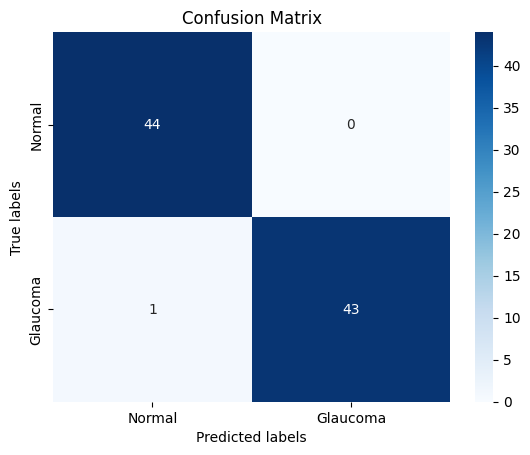

In [ ]:
#for epoch 15  batch 8 // Test(RIM-ONE_DL epch 15 batch 8 version2) //threshold  0.738232 *  //patcince 5 //lr=0.0001  ///// best
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate the confusion matrix
confusion_mat = confusion_matrix(y_test_new, y_pred_new)

# Plot the confusion matrix
labels = ["Normal", "Glaucoma"]
sns.heatmap(confusion_mat, annot=True, cmap="Blues", fmt="d", xticklabels=labels, yticklabels=labels)
plt.xlabel("Predicted labels")
plt.ylabel("True labels")
plt.title("Confusion Matrix")

# Save the figure
plt.savefig("/content/drive/MyDrive/Colab Notebooks/Project Implementation/Classification/good_graph_Aug_RIM-ONE_DL/After_use_all_augmented_for_Train/Classification_EfficientNetB0_Aug_Train_RIM-ONE_DL_epoch_15_batch_8_lr=0.0001_version2_confusion_matrix.png")

# Show the figure
plt.show()


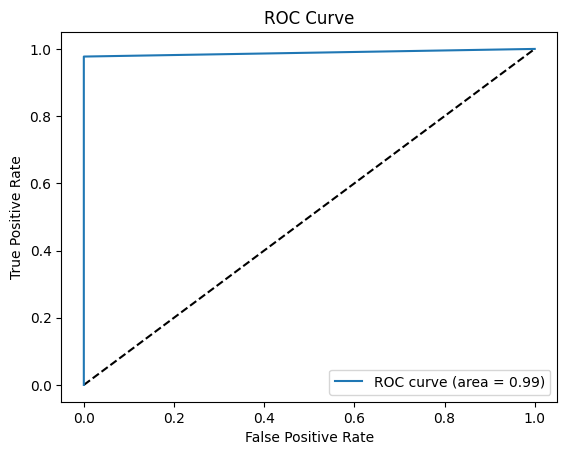

In [ ]:
#for epoch 15  batch 8 // Test(RIM-ONE_DL epch 15 batch 8 version2) //threshold  0.738232 *  //patcince 5 //lr=0.0001  ///// best
#ROC Curve


fpr, tpr, thresholds = roc_curve(y_test_new, y_pred_new)
plt.plot([0, 1], [0, 1], 'k--')
#plt.plot(fpr, tpr, label='EfficientNetB0')
plt.plot(fpr, tpr, label="ROC curve (area = %0.2f)" % auc)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.savefig('/content/drive/MyDrive/Colab Notebooks/Project Implementation/Classification/good_graph_Aug_RIM-ONE_DL/After_use_all_augmented_for_Train/Classification_EfficientNetB0_Aug_Train_RIM-ONE_DL_epoch_15_batch_8_lr=0.0001_version2_ROC Curve_graph.png')
plt.show();

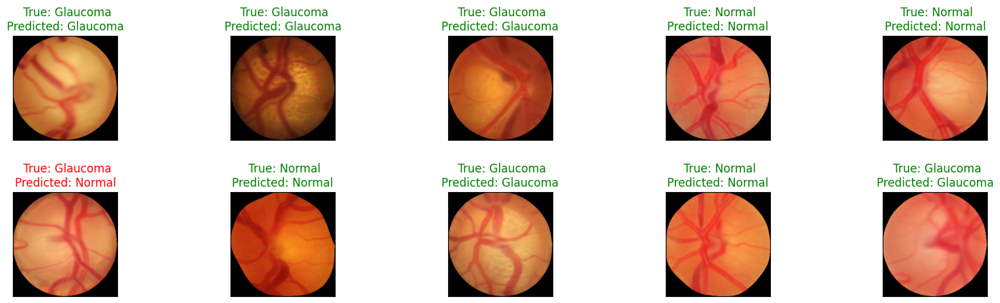

In [ ]:
#for epoch 15  batch 8 // Test(RIM-ONE_DL epch 15 batch 8 version2) //threshold  0.738232 *  //patcince 5 //lr=0.0001  ///// best
import cv2
import matplotlib.pyplot as plt
import numpy as np

labels = ["Normal", "Glaucoma"]

figure = plt.figure(figsize=(20, 8))

for i, index in enumerate(np.random.choice(X_test_new.shape[0], size=10, replace=False)):
    ax = figure.add_subplot(3, 5, i + 1, xticks=[], yticks=[])
    # Read the image in BGR format
    bgr_image = np.squeeze(X_test_new[index])
    # Convert the image to 8-bit (values between 0 and 255)
    bgr_image_8bit = cv2.normalize(bgr_image, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)
    # Convert the 8-bit BGR image to RGB
    rgb_image = cv2.cvtColor(bgr_image_8bit, cv2.COLOR_BGR2RGB)
    # Display the RGB image
    ax.imshow(rgb_image)
    predict_index = y_pred_new[index]
    true_index = y_test_new[index]
    # Set the title for each image
    true_label = labels[true_index]
    predict_label = labels[predict_index]
    title = " True: {}\nPredicted: {}".format(true_label, predict_label)
    ax.set_title(title, color=("green" if predict_index == true_index else "red"))

# Adjust the spacing between the subplots
figure.subplots_adjust(hspace=0.5)

# Save the figure
plt.savefig('/content/drive/MyDrive/Colab Notebooks/Project Implementation/Classification/good_graph_Aug_RIM-ONE_DL/After_use_all_augmented_for_Train/Classification_EfficientNetB0_Aug_Train_RIM-ONE_DL_epoch_15_batch_8_lr=0.0001_version2_test_sample_images.png')

1/1 [==============================] - 1s 1s/step


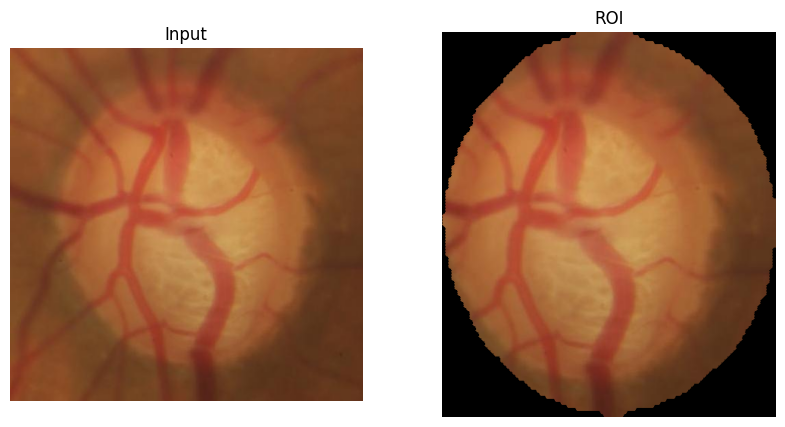

The prediction for the image is: Glaucoma


In [ ]:
#To test model on test set
import cv2
import numpy as np
from tensorflow.keras.models import load_model
from matplotlib import pyplot as plt


#I add
import efficientnet.tfkeras
from tensorflow.keras.models import load_model

# Load the segmentation model
segmentation_model = load_model('/content/drive/MyDrive/Colab Notebooks/Project Implementation/New_Experiments/Saved_model/Segmentation_UNET_Resnet34_ORIGA&RIMONEDL_with_Aug_V2_2040_without_denoising_Epoch_50_batch_16.hdf5', compile=False)

#Load the classification model
classification_model = load_model('/content/drive/MyDrive/Colab Notebooks/Project Implementation/Classification/Saved_model_RIM-ONE_DL/After_use_all_augmented_for_Train/Classification_EfficientNetB0_Aug_Train_RIM-ONE_DL_epoch_15_batch_8_lr=0.0001_version2_model.h5')
#
# Define the preprocessing function for the segmentation model
def preprocess_segmentation_image(image):
    # Apply resize
    new_width = 128
    new_height = 128
    dim = (new_width, new_height)
    resized_image = cv2.resize(image, dim, interpolation=cv2.INTER_AREA)
    # Preprocess the image
    preprocessed_image = resized_image / 255.
    return preprocessed_image

# Define the preprocessing function for the classification model
def preprocess_classification_image(image):
    # Resize the image
    img = cv2.resize(image, (224, 224))
    # Normalize the image
    img = img.astype('float32') / 255
    # Reshape the image to match the model's input shape
    img = np.expand_dims(img, axis=0)
    return img

# Load the image
image = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Project Implementation/RIM ONE DL_Data cleaning/RIM ONE DL_before cropped/Images/glaucoma/r2_Im289.png')

# Preprocess the image for segmentation
preprocessed_image = preprocess_segmentation_image(image)

# Make segmentation prediction
segmentation_prediction = segmentation_model.predict(np.expand_dims(preprocessed_image, axis=0))
segmentation_mask = np.argmax(segmentation_prediction, axis=3)[0]

# Resize the mask to match the image size
segmentation_mask_resized = cv2.resize(segmentation_mask.astype(np.uint8), (image.shape[1], image.shape[0]))


# Apply the mask to the original image
segmented_image = cv2.bitwise_and(image, image, mask=segmentation_mask_resized)

# Convert the segmented image to grayscale
gray = cv2.cvtColor(segmented_image, cv2.COLOR_BGR2GRAY)

# Find contours in the grayscale image
contours, _ = cv2.findContours(gray, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Find the bounding rectangle for each contour
bounding_rectangles = [cv2.boundingRect(contour) for contour in contours]

# Get the x, y, w, h of the bounding rectangle with the maximum area
x, y, w, h = max(bounding_rectangles, key=lambda rect: rect[2] * rect[3])

# Crop the black area from the segmented image
cropped_segmented_image = segmented_image[y:y+h, x:x+w]

# Preprocess the cropped segmented image for classification
preprocessed_segmented_image = preprocess_classification_image(cropped_segmented_image)

# Make classification prediction
classification_prediction = classification_model.predict(preprocessed_segmented_image)
label = "Glaucoma" if classification_prediction[0][0] >= 0.738232 else "Normal" #rather than 0.5

# Display the images and prediction using matplotlib
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
axs[0].set_title('Input')
axs[0].axis('off')
axs[1].imshow(cv2.cvtColor(cropped_segmented_image, cv2.COLOR_BGR2RGB))
axs[1].set_title('ROI')
axs[1].axis('off')
plt.show()

print(f"The prediction for the image is: {label}")


In [ ]:
# Import necessary libraries
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
# Install necessary packages
!pip install tensorflow==2.12
!pip install keras==2.12

In [ ]:
# Import necessary libraries
import keras
import tensorflow as tf
print(keras.__version__)
print(tf.__version__)

In [ ]:
# Import necessary libraries
import numpy as np
import pandas as pd
import os
from os import listdir
import cv2
import matplotlib.pyplot as plt
import imutils
from PIL import Image
from sklearn.model_selection import train_test_split
from keras import layers
from keras.utils.vis_utils import plot_model
from sklearn.metrics import accuracy_score, precision_score, recall_score
from sklearn.metrics import f1_score, cohen_kappa_score, roc_auc_score, confusion_matrix
from sklearn.metrics import classification_report, roc_curve
import seaborn as sns

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import  *
from tensorflow.keras.optimizers import Adam, SGD, RMSprop
from keras.layers import Dense, Dropout, Flatten, BatchNormalization
from tensorflow.keras.applications import DenseNet121, VGG19, ResNet50
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D

import PIL.Image
import matplotlib.pyplot as mpimg
import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array
from tensorflow.keras.preprocessing import image

In [ ]:
# Install imutils library
!pip install imutils

In [ ]:
# List the files in the directory
os.listdir('/content/drive/MyDrive/Colab Notebooks/Project Implementation/RIM ONE DL_Data cleaning/RIM ONE DL _after_downsampling')

In [ ]:
#showing image of normal
im = Image.open('/content/drive/MyDrive/Colab Notebooks/Project Implementation/RIM ONE DL_Data cleaning/RIM ONE DL _after_downsampling/normal/result_r1_Im003.png').resize((255, 255))
im

In [ ]:
#showing image of glaucoma
im = Image.open('/content/drive/MyDrive/Colab Notebooks/Project Implementation/RIM ONE DL_Data cleaning/RIM ONE DL _after_downsampling/glaucoma/result_r1_Im118.png').resize((255, 255))
im

In [ ]:
#setting the directory of our data
glaucoma = os.listdir('/content/drive/MyDrive/Colab Notebooks/Project Implementation/RIM ONE DL_Data cleaning/RIM ONE DL _after_downsampling/glaucoma')
normal = os.listdir('/content/drive/MyDrive/Colab Notebooks/Project Implementation/RIM ONE DL_Data cleaning/RIM ONE DL _after_downsampling/normal')

#concate two data
data = np.concatenate([glaucoma,normal])
assert (len(data) == len(glaucoma)+len(normal))

#mapping our classes to 1 and 0. 1 == glaucoma and 0 == normal
target_x = np.full(len(glaucoma),1)
target_y = np.full(len(normal),0)

#label of our data
data_target = np.concatenate([target_x,target_y])

assert (len(data_target) == len(target_x)+len(target_y))
assert (len(data_target) == len(data))

print(len(target_x), len(target_y))

In [ ]:
#Setting the height and width of the image for our model
IMG_HEIGHT = 224
IMG_WIDTH = 224
IMAGE_SIZE = [IMG_HEIGHT, IMG_WIDTH]

In [ ]:

X_data = []

# Reading images from the glaucoma directory, resizing, preprocessing, and appending to the list
for file in glaucoma:
    img = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Project Implementation/RIM ONE DL_Data cleaning/RIM ONE DL _after_downsampling/glaucoma/' + file)
    img2 = cv2.resize(img, (IMG_HEIGHT, IMG_WIDTH))
    #preprocessed_img = preprocess_image(img2)
    #X_data.append(preprocessed_img)
    X_data.append(img2)

# Reading images from the normal directory, resizing, preprocessing, and appending to the list
for file in normal:
    img = cv2.imread('/content/drive/MyDrive/Colab Notebooks/Project Implementation/RIM ONE DL_Data cleaning/RIM ONE DL _after_downsampling/normal/' + file)
    img2 = cv2.resize(img, (IMG_HEIGHT, IMG_WIDTH))
    #preprocessed_img = preprocess_image(img2)
    #X_data.append(preprocessed_img)
    X_data.append(img2)

X_data = np.squeeze(X_data)
assert (len(X_data) == len(data) == len(data_target))


In [ ]:
# normalize data
X = X_data.astype('float32')
X /= 255

In [ ]:
X_data.shape

In [ ]:
# split the data into 75:15:15 ratio
X_train, X_test, y_train, y_test = train_test_split(X, data_target, random_state=50, test_size=0.15, stratify = data_target)

print(len(y_train))
print(len(y_test))

In [ ]:
#I add
#sample of training data
import matplotlib.pyplot as plt
num_samples = 5
fig, axs = plt.subplots(1, num_samples, figsize=(10, 4))

for i in range(num_samples):
    axs[i].imshow(cv2.cvtColor(X_train[i], cv2.COLOR_BGR2RGB))  # Assuming grayscale images
    axs[i].set_title(''.format(i))
    axs[i].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
#from tensorflow.keras.applications import DenseNet121, VGG19, ResNet50
#define input shape
input_shape = (224,224,3)#DenseNet121, VGG19, ResNet50

#get the pretrained model
base_model = tf.keras.applications.ResNet50(input_shape= input_shape,
                                               include_top=False,
                                               weights='imagenet')

#set the trainable method of covolution layer as false
# why set to false?? because we don't want to mess up the pretrained weights of the model!!
base_model.trainable = False

In [ ]:
# Initialize a sequential model
model = Sequential()

# Add the base model to the sequential model
model.add(base_model)

# Add a batch normalization layer to the sequential model
model.add(BatchNormalization())

# Add a dropout layer with rate 0.3 to the sequential model
model.add(Dropout(0.3))

# Add a dense layer with 256 units and ReLU activation function to the sequential model
model.add(Dense(256, activation='relu'))

# Add a flatten layer to the sequential model
model.add(Flatten())

# Add a dropout layer with rate 0.5 to the sequential model
model.add(Dropout(0.5))

# Add a dense layer with 128 units and ReLU activation function to the sequential model
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(1, activation='sigmoid'))
model.summary()


In [ ]:
from keras.optimizers import Adam

model.compile(
    loss='binary_crossentropy',
    optimizer=Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0, amsgrad=False),#lr=0.01
    metrics=["acc"]
)

In [ ]:
#checkpoint which stores the weights of the model when maximum validation accuracy is found
checkpoint_filepath = "/content/drive/MyDrive/Colab Notebooks/Project Implementation/Classification/checkpoint_RIM-ONE DL/Classification_DenseNet121_RIM-ONE DL_15_batch_8_epoch_weights.best.hdf5"

checkpoint = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_acc',
    mode='max',
    save_best_only=True)



history = model.fit(X_train, y_train, batch_size = 8,
                    epochs = 15, validation_split = 0.18, callbacks=[checkpoint])

In [ ]:
# Save the model
model.save('/content/drive/MyDrive/Colab Notebooks/Project Implementation/Classification/Saved_model_RIM-ONE_DL/Classification_DenseNet121_RIM-ONE DL_epoch_15_batch_8_lr=0.01_model.h5')

In [ ]:
history = model.history.history

train_loss = history['loss']
val_loss = history['val_loss']
train_acc = history['acc']
val_acc = history['val_acc']


# Loss
plt.figure()
plt.plot(train_loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.xlabel('Number of Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
#plt.savefig('/content/drive/MyDrive/Colab Notebooks/Project Implementation/Classification/graphes_RIM-ONE_DL/Classification_ResNet50_RIM-ONE DL_15_batch_8_epoch_lr=0.01_loss_graph.png')#add
plt.show()

# Accuracy#
plt.figure()
plt.plot(train_acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.xlabel('Number of Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
#plt.savefig('/content/drive/MyDrive/Colab Notebooks/Project Implementation/Classification/graphes_RIM-ONE_DL/Classification_ResNet50_RIM-ONE DL_15_batch_8_epoch_lr=0.01_accuracy_graph.png')
plt.show()

In [ ]:
import pickle

# Save the history
with open('/content/drive/MyDrive/Colab Notebooks/Project Implementation/Classification/saved history/Classification_ResNet50_epoch_15_batch_8_lr=0.01_history.pickle', 'wb') as file:
    pickle.dump(history, file)

# **Model Evaluation**

In [ ]:
history = model.history.history

train_loss = history['loss']
val_loss = history['val_loss']
train_acc = history['acc']
val_acc = history['val_acc']


# Loss
plt.figure()
plt.plot(train_loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.xlabel('Number of Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
#plt.savefig('/content/drive/MyDrive/Colab Notebooks/Project Implementation/Classification/graphes_RIM-ONE_DL/Classification_ResNet50_RIM-ONE DL_15_batch_8_epoch_lr=0.01_loss_graph.png')#add
plt.show()

# Accuracy#
plt.figure()
plt.plot(train_acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.xlabel('Number of Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
#plt.savefig('/content/drive/MyDrive/Colab Notebooks/Project Implementation/Classification/graphes_RIM-ONE_DL/Classification_ResNet50_RIM-ONE DL_15_batch_8_epoch_lr=0.01_accuracy_graph.png')
plt.show()

In [ ]:
import pickle

# Save the history
with open('/content/drive/MyDrive/Colab Notebooks/Project Implementation/Classification/saved history/Classification_ResNet50_epoch_15_batch_8_lr=0.01_history.pickle', 'wb') as file:
    pickle.dump(history, file)

In [ ]:
# Evaluate the model on test set
score = model.evaluate(X_test, y_test, verbose=0)

# Print test accuracy
print('\n', 'Test accuracy:', score[1])

In [ ]:
y_hat = model.predict(X_test)
y_pred = [1 if x >= 0.5 else 0 for x in y_hat]

#metrics calculation

# accuracy: (tp + tn) / (p + n)
accuracy = accuracy_score(y_test, y_pred)
print('Accuracy: %f' % accuracy)

# precision tp / (tp + fp)
precision = precision_score(y_test, y_pred)
print('Precision: %f' % precision)

# recall: tp / (tp + fn)
recall = recall_score(y_test, y_pred)
print('Recall: %f' % recall)

# f1: 2 tp / (2 tp + fp + fn)
f1 = f1_score(y_test, y_pred)
print('F1 score: %f' % f1)

# ROC AUC
auc = roc_auc_score(y_test, y_pred)
print('ROC AUC: %f' % auc)

# confusion matrix
matrix = confusion_matrix(y_test, y_pred)
print(matrix)

# specificity calculation
tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
specificity = tn / (tn+fp)
print('Specificity: ',specificity)

#classification report
print(classification_report(y_test, y_pred))

#To save

import matplotlib.pyplot as plt
from sklearn.metrics import classification_report

# Generate classification report
report = classification_report(y_test, y_pred, output_dict=True)

# Convert report to a DataFrame for visualization
df_report = pd.DataFrame(report).transpose()

# Plot classification report
plt.figure(figsize=(8, 6))
sns.heatmap(df_report.iloc[:-1, :].T, annot=True, cmap='Blues')
plt.xlabel('Metrics')
plt.ylabel('Classes')
plt.title('Classification Report')

# Save classification report as image
#plt.savefig('/content/drive/MyDrive/Colab Notebooks/Project Implementation/Classification/graphes_RIM-ONE_DL/Classification_ResNet50_RIM-ONE DL_epoch_15_early_14_batch_8_lr=0.001_classification_report.png')


In [ ]:
# plot confusion matrix
categories = ['Normal', 'Glaucoma']
df_matrix = pd.DataFrame(matrix, index = categories, columns = categories)
sns.heatmap(df_matrix, annot=True, cmap='Blues', fmt='d')
#plt.savefig('/content/drive/MyDrive/Colab Notebooks/Project Implementation/Classification/graphes_RIM-ONE_DL/ClassificationResNet50_RIM-ONE DL_epoch_15_early_14_batch_8_lr=0.001_confusion_matrix.png')

In [ ]:
#ROC Curve

fpr, tpr, thresholds = roc_curve(y_test, y_pred)
plt.plot([0, 1], [0, 1], 'k--')
plt.plot(fpr, tpr, label='ResNet50_')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')
#plt.savefig('/content/drive/MyDrive/Colab Notebooks/Project Implementation/Classification/graphes_RIM-ONE_DL/Classification_ResNet50_RIM-ONE DL_epoch_15_early_14_batch_8_lr=0.001_ROC Curve_graph.png')
plt.show();

In [ ]:
# Evaluate the model on test set

#Check the confusion matrix for various thresholds. Which one is good?
#Need to balance positive, negative, false positive and false negative.
#ROC can help identify the right threshold.
##################################################################
"""
Receiver Operating Characteristic (ROC) Curve is a plot that helps us
visualize the performance of a binary classifier when the threshold is varied.
"""
#ROC
from sklearn.metrics import roc_curve
y_preds = model.predict(X_test).ravel()

fpr, tpr, thresholds = roc_curve(y_test, y_preds)
plt.figure(1)
plt.plot([0, 1], [0, 1], 'y--')
plt.plot(fpr, tpr, marker='.')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.show()



In [ ]:
# Evaluate the model on test set

#AUC
#Area under the curve (AUC) for ROC plot can be used to understand hpw well a classifier
#is performing.
#% chance that the model can distinguish between positive and negative classes.

from sklearn.metrics import auc
auc_value = auc(fpr, tpr)
print("Area under curve, AUC = ", auc_value)

In [ ]:
# Install necessary packages
!pip install tensorflow==2.12.0
!pip install efficientnet
!pip install gradio opencv-python

In [ ]:
import keras
import tensorflow as tf
print(keras.__version__)
print(tf.__version__)

2.12.0
2.12.0


# **GUI is created with Gradio**

In [ ]:
#Import libraries
import gradio as gr
import cv2
import numpy as np
from tensorflow.keras.models import load_model


#I add this to solve problem
import efficientnet.tfkeras

# Load the segmentation model
segmentation_model = load_model('/content/drive/MyDrive/Colab Notebooks/Project Implementation/New_Experiments/Saved_model/Segmentation_UNET_Resnet34_ORIGA&RIMONEDL_with_Aug_V2_2040_without_denoising_Epoch_50_batch_16.hdf5', compile=False)

# Load the classification model

classification_model = load_model('/content/drive/MyDrive/Colab Notebooks/Project Implementation/Classification/Saved_model_HRF/Classification_EfficientNetB0_Aug_Train_HRF_epoch_15_batch_4_with_two_droupout_lr=0.0001_model.h5')

# Define the preprocessing function for the segmentation model
def preprocess_segmentation_image(image):
    # Apply resize
    new_width = 128
    new_height = 128
    dim = (new_width, new_height)
    resized_image = cv2.resize(image, dim, interpolation=cv2.INTER_AREA)
    # Preprocess the image
    preprocessed_image = resized_image / 255.
    return preprocessed_image

# Define the preprocessing function for the classification model
def preprocess_classification_image(image):
    # Resize the image
    img = cv2.resize(image, (224, 224))
    # Normalize the image
    img = img.astype('float32') / 255
    # Reshape the image to match the model's input shape
    img = np.expand_dims(img, axis=0)
    return img

def predict(image):
    # Convert the image from RGB to BGR
    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)

    # Preprocess the image for segmentation
    preprocessed_image = preprocess_segmentation_image(image)

    # Make segmentation prediction
    segmentation_prediction = segmentation_model.predict(np.expand_dims(preprocessed_image, axis=0))
    segmentation_mask = np.argmax(segmentation_prediction, axis=3)[0]

    # Resize the mask to match the image size
    segmentation_mask_resized = cv2.resize(segmentation_mask.astype(np.uint8), (image.shape[1], image.shape[0]))

    # Apply the mask to the original image
    segmented_image = cv2.bitwise_and(image, image, mask=segmentation_mask_resized)

    # Convert the segmented image to grayscale
    gray = cv2.cvtColor(segmented_image, cv2.COLOR_BGR2GRAY)

    # Find contours in the grayscale image
    contours, _ = cv2.findContours(gray, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Find the bounding rectangle for each contour
    bounding_rectangles = [cv2.boundingRect(contour) for contour in contours]

    # Get the x, y, w, h of the bounding rectangle with the maximum area
    x, y, w, h = max(bounding_rectangles, key=lambda rect: rect[2] * rect[3])

    # Crop the black area from the segmented image
    cropped_segmented_image = segmented_image[y:y+h, x:x+w]

    # Preprocess the cropped segmented image for classification
    preprocessed_segmented_image = preprocess_classification_image(cropped_segmented_image)

    # Make classification prediction
    classification_prediction = classification_model.predict(preprocessed_segmented_image)
    label = "Glaucoma" if classification_prediction[0][0] >=   0.213948 else "Normal"  #I change from 0.5 to  0.213948

    # Convert the cropped segmented image back to RGB
    cropped_segmented_image = cv2.cvtColor(cropped_segmented_image, cv2.COLOR_BGR2RGB)

    return cropped_segmented_image, label

iface = gr.Interface(fn=predict, inputs="image", outputs=["image", "text"], title="Glaucoma Detection on Enhanced Retinal Images Based Deep Learning")
iface.launch()

Setting queue=True in a Colab notebook requires sharing enabled. Setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
Running on public URL: https://0177a09adaaefc466e.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from Terminal to deploy to Spaces (https://huggingface.co/spaces)


In [ ]:
# Install necessary packages
!pip install tensorflow==2.12.0
!pip install efficientnet
!pip install gradio opencv-python

In [ ]:
import keras
import tensorflow as tf
print(keras.__version__)
print(tf.__version__)

2.12.0
2.12.0


# **GUI is created with Gradio**

In [ ]:
#Import libraries
import gradio as gr
import cv2
import numpy as np
from tensorflow.keras.models import load_model

# Load the segmentation model
segmentation_model = load_model('/content/drive/MyDrive/Colab Notebooks/Project Implementation/New_Experiments/Saved_model/Segmentation_UNET_Resnet34_ORIGA&RIMONEDL_with_Aug_V2_2040_without_denoising_Epoch_50_batch_16.hdf5', compile=False)

# Load the classification model
classification_model = load_model('/content/drive/MyDrive/Colab Notebooks/Project Implementation/Classification/Saved_model_ORIGA/After_use_all_augmented_for_Train/Classification_EfficientNetB0_Aug_Train_ORIGA_epoch_15_batch_32_lr=0.0001_model.h5')

# Define the preprocessing function for the segmentation model
def preprocess_segmentation_image(image):
    # Apply resize
    new_width = 128
    new_height = 128
    dim = (new_width, new_height)
    resized_image = cv2.resize(image, dim, interpolation=cv2.INTER_AREA)
    # Preprocess the image
    preprocessed_image = resized_image / 255.
    return preprocessed_image

# Define the preprocessing function for the classification model
def preprocess_classification_image(image):
    # Resize the image
    img = cv2.resize(image, (224, 224))
    # Normalize the image
    img = img.astype('float32') / 255
    # Reshape the image to match the model's input shape
    img = np.expand_dims(img, axis=0)
    return img

def predict(image):
    # Convert the image from RGB to BGR
    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)

    # Preprocess the image for segmentation
    preprocessed_image = preprocess_segmentation_image(image)

    # Make segmentation prediction
    segmentation_prediction = segmentation_model.predict(np.expand_dims(preprocessed_image, axis=0))
    segmentation_mask = np.argmax(segmentation_prediction, axis=3)[0]

    # Resize the mask to match the image size
    segmentation_mask_resized = cv2.resize(segmentation_mask.astype(np.uint8), (image.shape[1], image.shape[0]))

    # Apply the mask to the original image
    segmented_image = cv2.bitwise_and(image, image, mask=segmentation_mask_resized)

    # Convert the segmented image to grayscale
    gray = cv2.cvtColor(segmented_image, cv2.COLOR_BGR2GRAY)

    # Find contours in the grayscale image
    contours, _ = cv2.findContours(gray, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Find the bounding rectangle for each contour
    bounding_rectangles = [cv2.boundingRect(contour) for contour in contours]

    # Get the x, y, w, h of the bounding rectangle with the maximum area
    x, y, w, h = max(bounding_rectangles, key=lambda rect: rect[2] * rect[3])

    # Crop the black area from the segmented image
    cropped_segmented_image = segmented_image[y:y+h, x:x+w]

    # Preprocess the cropped segmented image for classification
    preprocessed_segmented_image = preprocess_classification_image(cropped_segmented_image)

    # Make classification prediction
    classification_prediction = classification_model.predict(preprocessed_segmented_image)
    label = "Glaucoma" if classification_prediction[0][0] >= 0.174685 else "Normal"  #I change from 0.5 to 0.174685

    # Convert the cropped segmented image back to RGB
    cropped_segmented_image = cv2.cvtColor(cropped_segmented_image, cv2.COLOR_BGR2RGB)

    return cropped_segmented_image, label

iface = gr.Interface(fn=predict, inputs="image", outputs=["image", "text"], title="Glaucoma Detection on Enhanced Retinal Images Based Deep Learning")
iface.launch()

Setting queue=True in a Colab notebook requires sharing enabled. Setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
Running on public URL: https://86cf6c90daccfc1bd3.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from Terminal to deploy to Spaces (https://huggingface.co/spaces)


In [ ]:
# Install necessary packages
!pip install tensorflow==2.12.0
!pip install efficientnet
!pip install gradio opencv-python

In [ ]:
import keras
import tensorflow as tf
print(keras.__version__)
print(tf.__version__)

2.12.0
2.12.0


# **GUI is created with Gradio**

In [ ]:
#Import libraries
import gradio as gr
import cv2
import numpy as np
from tensorflow.keras.models import load_model

#I add
import efficientnet.tfkeras
from tensorflow.keras.models import load_model

# Load the segmentation model
segmentation_model = load_model('/content/drive/MyDrive/Colab Notebooks/Project Implementation/New_Experiments/Saved_model/Segmentation_UNET_Resnet34_ORIGA&RIMONEDL_with_Aug_V2_2040_without_denoising_Epoch_50_batch_16.hdf5', compile=False)

# Load the classification model
classification_model = load_model('/content/drive/MyDrive/Colab Notebooks/Project Implementation/Classification/Saved_model_RIM-ONE_DL/After_use_all_augmented_for_Train/Classification_EfficientNetB0_Aug_Train_RIM-ONE_DL_epoch_15_batch_8_lr=0.0001_version2_model.h5')
#
# Define the preprocessing function for the segmentation model
def preprocess_segmentation_image(image):
    # Apply resize
    new_width = 128
    new_height = 128
    dim = (new_width, new_height)
    resized_image = cv2.resize(image, dim, interpolation=cv2.INTER_AREA)
    # Preprocess the image
    preprocessed_image = resized_image / 255.
    return preprocessed_image

# Define the preprocessing function for the classification model
def preprocess_classification_image(image):
    # Resize the image
    img = cv2.resize(image, (224, 224))
    # Normalize the image
    img = img.astype('float32') / 255
    # Reshape the image to match the model's input shape
    img = np.expand_dims(img, axis=0)
    return img

def predict(image):
    # Convert the image from RGB to BGR
    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)

    # Preprocess the image for segmentation
    preprocessed_image = preprocess_segmentation_image(image)

    # Make segmentation prediction
    segmentation_prediction = segmentation_model.predict(np.expand_dims(preprocessed_image, axis=0))
    segmentation_mask = np.argmax(segmentation_prediction, axis=3)[0]

    # Resize the mask to match the image size
    segmentation_mask_resized = cv2.resize(segmentation_mask.astype(np.uint8), (image.shape[1], image.shape[0]))

    # Apply the mask to the original image
    segmented_image = cv2.bitwise_and(image, image, mask=segmentation_mask_resized)

    # Convert the segmented image to grayscale
    gray = cv2.cvtColor(segmented_image, cv2.COLOR_BGR2GRAY)

    # Find contours in the grayscale image
    contours, _ = cv2.findContours(gray, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Find the bounding rectangle for each contour
    bounding_rectangles = [cv2.boundingRect(contour) for contour in contours]

    # Get the x, y, w, h of the bounding rectangle with the maximum area
    x, y, w, h = max(bounding_rectangles, key=lambda rect: rect[2] * rect[3])

    # Crop the black area from the segmented image
    cropped_segmented_image = segmented_image[y:y+h, x:x+w]

    # Preprocess the cropped segmented image for classification
    preprocessed_segmented_image = preprocess_classification_image(cropped_segmented_image)

    # Make classification prediction
    classification_prediction = classification_model.predict(preprocessed_segmented_image)
    label = "Glaucoma" if classification_prediction[0][0] >= 0.738232 else "Normal" #rather than 0.5

    # Convert the cropped segmented image back to RGB
    cropped_segmented_image = cv2.cvtColor(cropped_segmented_image, cv2.COLOR_BGR2RGB)

    return cropped_segmented_image, label


iface = gr.Interface(fn=predict, inputs="image", outputs=["image", "text"], title="Glaucoma Detection on Enhanced Retinal Images Based Deep Learning")
iface.launch()



Setting queue=True in a Colab notebook requires sharing enabled. Setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
Running on public URL: https://9896a22aa8b1d56fe9.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from Terminal to deploy to Spaces (https://huggingface.co/spaces)
